In [1]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pickle
import time

from pymongo import MongoClient
from sklearn.manifold import TSNE

import tensorflow as tf
from tensorflow.contrib.slim import fully_connected as fc

from ThemeSeacher import Updator, clean, PhraserModel, tokenizer
from ThemeSeacher import KeywordDict, Model, Extractor
from ThemeSeacher import EmbeddingModel, Clustering


/home/qara/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Embedding default loaded


In [3]:
phraser = PhraserModel().get_phraser
dic = KeywordDict(phraser=phraser).get_dict

phraser_default.bin  loaded
keyword dictionary loaded


# Data Load

In [4]:
client = MongoClient('localhost', 27017)
db = client['reddit']

def load_mongo():
    rows = db.submission.find({'subreddit':'worldnews'})
    return pd.DataFrame(list(rows))


# Pickle Functions

In [5]:
def save_obj(obj, name):
    with open('obj/' + name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name):
    with open('obj/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

def exist(name):
    return os.path.exists('obj/' + name + '.pkl')


In [6]:
total_data = load_obj('upper1')
#total_data = load_obj('total_data')

l = load_obj('lemmatized')

total_data['lemmatized'] = pd.Series(l)

total_data = total_data[['date', 'score', 'title', 'lemmatized']]

total_data = total_data.drop(total_data[total_data.lemmatized.apply(len)==0].index)

save_obj(total_data, 'total_data')

total_data = total_data[total_data.score>1]
save_obj(total_data, 'upper1')

# TF-IDF model

In [16]:
tfidf = Model(dic, name='bpc', smartirs='bpc', phraser=phraser).get_model

Model bpc loaded


In [14]:
phraser = PhraserModel().get_phraser

def sentence2keywords(title, topn=None):
    splitted = phraser[tokenizer([clean(title)])]
    scores = tfidf[dic.doc2bow(splitted[0])]
    keyword = []
    for idx, score in scores:
        keyword.append((tfidf.id2word[idx], score))
    keyword.sort(key=lambda k: k[1], reverse=True)
    
    if topn!=None:
        return keyword[:topn]
    else:
        return keyword

def words2keywords(words, topn=None):
    scores = tfidf[dic.doc2bow(words)]
    keyword = []
    for idx, score in scores:
        keyword.append((tfidf.id2word[idx], score))
    keyword.sort(key=lambda k: k[1], reverse=True)
    
    if topn!=None:
        return keyword[:topn]
    else:
        return keyword

phraser_default.bin  loaded


In [67]:
words2keywords(['wood', 'pressure', 'cleaning'])

[('cleaning', 0.8731389063131006),
 ('wood', 0.4280231851614056),
 ('pressure', 0.23329081260659953)]

In [68]:
sentence2keywords('Justin Trudeau vows to speak out on human rights, refuses to back down in Saudi Arabia dispute')

[('justin_trudeau', 0.5369843190868537),
 ('vow', 0.35964720329970695),
 ('refuse', 0.35338146431025275),
 ('dispute', 0.349834149111915),
 ('saudi_arabia', 0.31552995623686514),
 ('human', 0.31146978900533356),
 ('speak', 0.304399284378011),
 ('right', 0.16848540325995237),
 ('back', 0.13198674487702344)]

In [6]:
sentence2keywords('The New Horizons spacecraft has spotted an ultraviolet glow that seems to emanate from near the edge of the solar system. It may come from a long-sought wall of hydrogen.')

[('ultraviolet', 0.41155683098916707),
 ('hydrogen', 0.3705225917949381),
 ('spacecraft', 0.3664558104184488),
 ('glow', 0.36273216688806076),
 ('emanate', 0.35782144827066936),
 ('horizon', 0.24517225480209612),
 ('wall', 0.2446736189303464),
 ('solar', 0.21213155879377985),
 ('spot', 0.18541149511800203),
 ('seek', 0.15718488040479028),
 ('seem', 0.1476381879499995),
 ('edge', 0.1303822102011575),
 ('long', 0.12504599826221915),
 ('system', 0.1175112952477427),
 ('come', 0.06948756164796704),
 ('new', 0.047985261279187404),
 ('have', 0.001148652725094678)]

# Clustering

In [18]:
embedding = EmbeddingModel().get_embedding
cluster = Clustering()

Embedding default loaded
kmeans.bin  loaded


In [14]:
cluster.get_cluster('ultraviolet')[0]

1923

In [13]:
def keyword2cluster(keyword):
    return cluster.get_keyword(cluster.get_cluster(keyword)[0])

def doc2cluster(words):
    result = []
    for word in words:
        result.append(cluster.get_cluster(word)[0])
    return result

In [83]:
keyword2cluster('saudi_arabia')

/home/qara/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('opec', 0.9376348853111267),
 ('opec_member', 0.9180275797843933),
 ('saudi_arabia', 0.9065777659416199),
 ('xsaudi_arabia', 0.881696879863739),
 ('freeze_output', 0.8782925605773926),
 ('opec_nonmember', 0.8764657974243164),
 ('vienna_cartel', 0.8726072311401367),
 ('opec_cartel', 0.8676886558532715),
 ('venezuela_qatar', 0.8674944639205933),
 ('qatar_venezuela', 0.8664891719818115)]

In [38]:
total_data.lemmatized[:10].apply(doc2cluster)

0                                    [572, 1346, 1411]
1    [146, 1884, 1554, 1554, 989, 748, 212, 918, 1945]
2    [1346, 930, 497, 977, 167, 681, 1814, 1554, 97...
3                          [271, 1695, 1770, 644, 228]
4                     [1554, 1939, 144, 971, 126, 401]
5               [536, 112, 626, 1082, 1554, 1510, 229]
6                  [1569, 1957, 1934, 335, 1451, 1698]
7          [1346, 930, 977, 1984, 748, 116, 1116, 497]
8             [68, 134, 1191, 1904, 748, 55, 938, 144]
9                                 [847, 684, 252, 697]
Name: lemmatized, dtype: object

In [46]:
total_data.groupby(['date']).sum().head()

,score
date,
2013-01-01,7606
2013-01-02,17216
2013-01-03,14308
2013-01-04,17240
2013-01-05,19093


In [47]:
total_data.groupby(['date']).max().head()

,score,title,lemmatized
date,,,
2013-01-01,2893,wordpresswebblog the way to eliminate win secu...,"[wood, pressure, cleaning]"
2013-01-02,2899,young urban indians new poltical power amp voi...,"[young, urban, indian, new, poltical, power, a..."
2013-01-03,2942,zoo gorillas have earned a reputation for doin...,"[zoo, gorilla, earn, reputation, whole_lot, no..."
2013-01-04,3102,youre a fucking bitch hilarious,"[yoga_teacher_train, rishikesh]"
2013-01-05,2483,zinc hungry china asks canada to back giant mine,"[zinc, hungry, china, ask, canada, back, giant..."


In [69]:
words2keywords(['wood', 'pressure', 'cleaning'])

[('cleaning', 0.8731389063131006),
 ('wood', 0.4280231851614056),
 ('pressure', 0.23329081260659953)]

# Sentence Embedding

In [8]:
new_df = load_obj('new_embedding')

In [159]:
new_df = pd.DataFrame(columns=['date', 'embed'])

In [160]:
new_df.date = list(total_data.groupby(['date']).mean().index)

In [193]:
startt = time.time()
for ni, nrow in new_df.iterrows():
    if (ni+1)%200 == 0:
        print(ni+1, 'steps -', time.time()-startt, 'sec')
    
    date = nrow['date']
    df_day = total_data[total_data.date == date]
    
    upcount = 0
    sentence_embedding = np.zeros(100, dtype=np.float32)
    for index, row in df_day.iterrows():
        keywords = words2keywords(row.lemmatized)
        if len(keywords)==0:
            continue
        words, idf_scores = zip(*keywords)
        upscore = row['score']
        #upscore = np.log(row['score'])
        #upscore = 1 - np.power(np.e, -0.005*row['score'])

        ## normalize IDF score ##
        idf_scores = idf_scores/sum(idf_scores)
        
        avg_embedding = np.zeros(100, dtype=np.float32)
        for idx in range(len(words)):-
            word = words[idx]
            idf = idf_scores[idx]
            embedding_vec = embedding[word]
            avg_embedding += idf*embedding_vec
        
        upcount += upscore
        sentence_embedding += upscore * avg_embedding
    
    sentence_embedding /= upcount
    new_df.loc[ni, 'embed'] = sentence_embedding
    #new_df.loc[ni, 'embed_log'] = sentence_embedding
    #new_df.loc[ni, 'embed_exp'] = sentence_embedding

print('Done.')

/home/qara/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


200 steps - 19.28016948699951 sec
400 steps - 40.89280343055725 sec
600 steps - 62.20207667350769 sec
800 steps - 83.2694582939148 sec
1000 steps - 104.90566062927246 sec
1200 steps - 125.38835263252258 sec
1400 steps - 151.07297801971436 sec
1600 steps - 172.7263503074646 sec


In [200]:
new_df['score'] = total_data.groupby('date').sum().values

In [202]:
save_obj(new_df, 'new_embedding')

# t-SNE

### 1. Original score embedding

In [172]:
tsne = TSNE(n_components=2, random_state=0)
Y = tsne.fit_transform(list(new_df.embed))

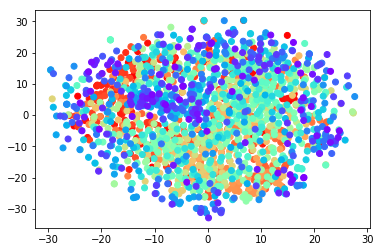

In [179]:
bs = len(new_df)
colors = cm.rainbow(np.linspace(1, 0, bs))
for i in range(len(new_df)//bs):
    x1 = Y[bs*i:bs*(i+1), 0]
    y1 = Y[bs*i:bs*(i+1):, 1]
    plt.xlim(-80, 70)
    plt.ylim(-80, 70)
    plt.scatter(x1, y1, color=colors)
    plt.show()

### 2. Log score embedding

In [205]:
tsne_log = TSNE(n_components=2, random_state=0)
Y_log = tsne_log.fit_transform(list(new_df.embed_log))

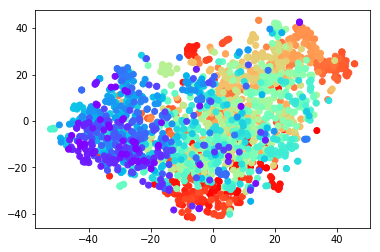

In [181]:
bs = len(new_df)
colors = cm.rainbow(np.linspace(1, 0, bs))
for i in range(len(new_df)//bs):
    x1 = Y_log[bs*i:bs*(i+1), 0]
    y1 = Y_log[bs*i:bs*(i+1):, 1]
    plt.xlim(-80, 70)
    plt.ylim(-80, 70)
    plt.scatter(x1, y1, color=colors)
    plt.show()

### 3. Exponential score embedding

In [203]:
tsne_exp = TSNE(n_components=2, random_state=0)
Y_exp = tsne_exp.fit_transform(list(new_df.embed_exp))

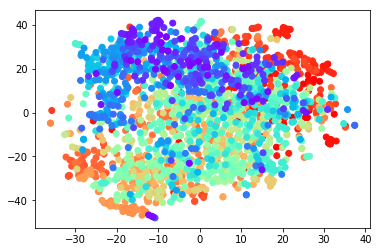

In [204]:
bs = len(new_df)
colors = cm.rainbow(np.linspace(1, 0, bs))
for i in range(len(new_df)//bs):
    x1 = Y_exp[bs*i:bs*(i+1), 0]
    y1 = Y_exp[bs*i:bs*(i+1):, 1]
    plt.xlim(-80, 70)
    plt.ylim(-80, 70)
    plt.scatter(x1, y1, color=colors)
    plt.show()

# Moving Average

### Average with original score

In [57]:
new_df['weighted'] = new_df.embed * new_df.score

avg_embed = []
for index, row in new_df.iterrows():
    row_sum = new_df.loc[index-6:index, ['score', 'weighted']].sum()
    avg_embed.append(np.array(row_sum.weighted / row_sum.score))
    
new_df['avg_embed'] = pd.Series(avg_embed)

### Average with log score

In [112]:
new_df['weighted'] = new_df.embed_log * new_df.score

avg_embed = []
for index, row in new_df.iterrows():
    row_sum = new_df.loc[index-6:index, ['score', 'weighted']].sum()
    avg_embed.append(np.array(row_sum.weighted / row_sum.score))

new_df['avg_embed_log'] = pd.Series(avg_embed)

### t-SNE - moving average original score

In [60]:
tsne_avg = TSNE(n_components=2, random_state=0)
Y_avg = tsne_avg.fit_transform(list(new_df.avg_embed))

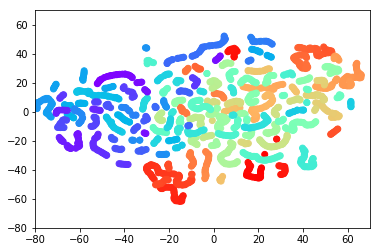

In [74]:
bs = len(new_df)
colors = cm.rainbow(np.linspace(1, 0, bs))
for i in range(len(new_df)//bs):
    x1 = Y_avg[bs*i:bs*(i+1), 0]
    y1 = Y_avg[bs*i:bs*(i+1):, 1]
    plt.xlim(-80, 70)
    plt.ylim(-80, 70)
    plt.scatter(x1, y1, color=colors)
    plt.show()

### t-SNE - moving average log score

In [65]:
tsne_avg_log = TSNE(n_components=2, random_state=0)
Y_avg_log = tsne_avg_log.fit_transform(list(new_df.avg_embed_log))

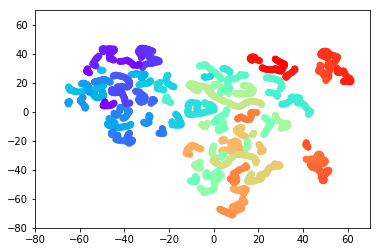

In [78]:
bs = len(new_df)
colors = cm.rainbow(np.linspace(1, 0, bs))
for i in range(len(new_df)//bs):
    x1 = Y_avg_log[bs*i:bs*(i+1), 0]
    y1 = Y_avg_log[bs*i:bs*(i+1):, 1]
    plt.xlim(-80, 70)
    plt.ylim(-80, 70)
    plt.scatter(x1, y1, color=colors)
    plt.show()

## Similar Vectors

In [235]:
def near_word(vec):
    result = embedding.similar_by_vector(vec)
    words, scores = zip(*result)
    return words

In [236]:
new_df['near'] = new_df.embed_log.apply(near_word)

/home/qara/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `similar_by_vector` (Method will be removed in 4.0.0, use self.wv.similar_by_vector() instead).
  
/home/qara/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [ ]:
new_df.loc[:,['date', 'near']].head()

# VAE

In [2]:
if not 'total_data' in dir():
    total_data = load_obj('upper1')
total_data = total_data.drop(['title'], axis=1)

NameError: name 'load_obj' is not defined

### Model

In [197]:
class VAE(object):

    def __init__(self, n_z=6, learning_rate=1e-3, beta=100):
        self.learning_rate = learning_rate
        self.n_z = n_z
        self.beta = beta

        self.build()
        with tf.device("/gpu:0"):
            self.sess = tf.InteractiveSession(config=tf.ConfigProto(
                #gpu_options=tf.GPUOptions(per_process_gpu_memory_fraction=fraction),
                gpu_options=tf.GPUOptions(allow_growth=True),
                log_device_placement=True))
        
        self.sess.run(tf.global_variables_initializer())

    # Build the netowrk and the loss functions
    def build(self):
        self.x = tf.placeholder(name='x', dtype=tf.float32, shape=[None, 100])

        # Encode
        # x -> z_mean, z_sigma -> z
        f1 = fc(self.x, 100, scope='enc_fc1', activation_fn=tf.nn.elu)
        f2 = fc(f1, 64, scope='enc_fc2', activation_fn=tf.nn.elu)
        f3 = fc(f2, 64, scope='enc_fc3', activation_fn=tf.nn.elu)
        f4 = fc(f3, 32, scope='enc_fc4', activation_fn=tf.nn.elu)
        f5 = fc(f4, 32, scope='enc_fc5', activation_fn=tf.nn.elu)
        f6 = fc(f5, 16, scope='enc_fc6', activation_fn=tf.nn.elu)
        self.z_mu = fc(f6, self.n_z, scope='enc_fc7_mu', activation_fn=None)
        self.z_log_sigma_sq = fc(f6, self.n_z, scope='enc_fc7_sigma', activation_fn=None)
        eps = tf.random_normal(shape=tf.shape(self.z_log_sigma_sq),
                               mean=0, stddev=0.01, dtype=tf.float32)
        self.z = self.z_mu + tf.sqrt(tf.exp(self.z_log_sigma_sq)) * eps

        # Decode
        # z -> x_hat
        g1 = fc(self.z, 16, scope='dec_fc1', activation_fn=tf.nn.elu)
        g2 = fc(g1, 32, scope='dec_fc2', activation_fn=tf.nn.elu)
        g3 = fc(g2, 32, scope='dec_fc3', activation_fn=tf.nn.elu)
        g4 = fc(g3, 64, scope='dec_fc4', activation_fn=tf.nn.elu)
        g5 = fc(g4, 64, scope='dec_fc5', activation_fn=tf.nn.elu)
        g6 = fc(g5, 100, scope='dec_fc6', activation_fn=tf.nn.elu)
        self.x_hat = fc(g6, 100, scope='dec_fc7', activation_fn=None)

        # Loss
        # Reconstruction loss
        # Minimize the cross-entropy loss
        # H(x, x_hat) = -\Sigma x*log(x_hat) + (1-x)*log(1-x_hat)
        epsilon = 1e-10
        #'''
        recon_loss = tf.nn.l2_loss(self.x_hat - self.x)
        '''
        recon_loss = -tf.reduce_sum(
            self.x * tf.log(epsilon+self.x_hat) + (1-self.x) * tf.log(epsilon+1-self.x_hat),
            axis=1
        )
        #'''
        self.recon_loss = tf.reduce_mean(recon_loss)

        # Latent loss
        # Kullback Leibler divergence: measure the difference between two distributions
        # Here we measure the divergence between the latent distribution and N(0, 1)
        latent_loss = -0.5 * tf.reduce_sum(
            1 + self.z_log_sigma_sq - tf.square(self.z_mu) - tf.exp(self.z_log_sigma_sq), axis=1)
        self.latent_loss = tf.reduce_mean(latent_loss)

        self.total_loss = tf.reduce_mean(recon_loss + self.beta * latent_loss)
        self.train_op = tf.train.AdamOptimizer(
            learning_rate=self.learning_rate).minimize(self.total_loss)
        return

    # Execute the forward and the backward pass
    def run_single_step(self, x):
        _, loss, recon_loss, latent_loss = self.sess.run(
            [self.train_op, self.total_loss, self.recon_loss, self.latent_loss],
            feed_dict={self.x: x}
        )
        return loss, recon_loss, latent_loss

    # x -> x_hat
    def reconstructor(self, x):
        x_hat = self.sess.run(self.x_hat, feed_dict={self.x: x})
        return x_hat

    # z -> x
    def generator(self, z):
        x_hat = self.sess.run(self.x_hat, feed_dict={self.z: z})
        return x_hat

    # x -> z
    def transformer(self, x):
        z = self.sess.run(self.z, feed_dict={self.x: x})
        return z
    
    def restore(self, saver, ckpt):
        saver.restore(self.sess, ckpt)

### Input Generator & Trainer

In [185]:
class VAE_3layer(object):

    def __init__(self, n_z=6, learning_rate=1e-3, beta=100):
        self.learning_rate = learning_rate
        self.n_z = n_z
        self.beta = beta

        self.build()
        
        self.sess = tf.InteractiveSession()
        self.sess.run(tf.global_variables_initializer())

    # Build the netowrk and the loss functions
    def build(self):
        self.x = tf.placeholder(name='x', dtype=tf.float32, shape=[None, 100])

        # Encode
        # x -> z_mean, z_sigma -> z
        f1 = fc(self.x, 64, scope='enc_fc1', activation_fn=tf.nn.elu)
        f2 = fc(f1, 48, scope='enc_fc2', activation_fn=tf.nn.elu)
        f3 = fc(f2, 32, scope='enc_fc3', activation_fn=tf.nn.elu)
        self.z_mu = fc(f3, self.n_z, scope='enc_fc4_mu', activation_fn=None)
        self.z_log_sigma_sq = fc(f3, self.n_z, scope='enc_fc4_sigma', activation_fn=None)
        eps = tf.random_normal(shape=tf.shape(self.z_log_sigma_sq),
                               mean=0, stddev=0.01, dtype=tf.float32)
        self.z = self.z_mu + tf.sqrt(tf.exp(self.z_log_sigma_sq)) * eps

        # Decode
        # z -> x_hat
        g1 = fc(self.z, 32, scope='dec_fc1', activation_fn=tf.nn.elu)
        g2 = fc(g1, 48, scope='dec_fc2', activation_fn=tf.nn.elu)
        g3 = fc(g2, 64, scope='dec_fc3', activation_fn=tf.nn.elu)
        self.x_hat = fc(g3, 100, scope='dec_fc4', activation_fn=tf.sigmoid)

        # Loss
        # Reconstruction loss
        # Minimize the cross-entropy loss
        # H(x, x_hat) = -\Sigma x*log(x_hat) + (1-x)*log(1-x_hat)
        epsilon = 1e-10
        #'''
        recon_loss = tf.nn.l2_loss(self.x_hat - self.x)
        '''
        recon_loss = -tf.reduce_sum(
            self.x * tf.log(epsilon+self.x_hat) + (1-self.x) * tf.log(epsilon+1-self.x_hat),
            axis=1
        )
        #'''
        self.recon_loss = tf.reduce_mean(recon_loss)

        # Latent loss
        # Kullback Leibler divergence: measure the difference between two distributions
        # Here we measure the divergence between the latent distribution and N(0, 1)
        latent_loss = -0.5 * tf.reduce_sum(
            1 + self.z_log_sigma_sq - tf.square(self.z_mu) - tf.exp(self.z_log_sigma_sq), axis=1)
        self.latent_loss = tf.reduce_mean(latent_loss)

        self.total_loss = tf.reduce_mean(recon_loss + self.beta * latent_loss)
        self.train_op = tf.train.AdamOptimizer(
            learning_rate=self.learning_rate).minimize(self.total_loss)
        return

    # Execute the forward and the backward pass
    def run_single_step(self, x):
        _, loss, recon_loss, latent_loss = self.sess.run(
            [self.train_op, self.total_loss, self.recon_loss, self.latent_loss],
            feed_dict={self.x: x}
        )
        return loss, recon_loss, latent_loss

    # x -> x_hat
    def reconstructor(self, x):
        x_hat = self.sess.run(self.x_hat, feed_dict={self.x: x})
        return x_hat

    # z -> x
    def generator(self, z):
        x_hat = self.sess.run(self.x_hat, feed_dict={self.z: z})
        return x_hat

    # x -> z
    def transformer(self, x):
        z = self.sess.run(self.z, feed_dict={self.x: x})
        return z
    
    def restore(self, saver, ckpt):
        saver.restore(self.sess, ckpt)

In [198]:
def generator(lemmatized_list, bs=100):
    np.random.shuffle(lemmatized_list)
    for i in range(len(lemmatized_list)//bs):
        rows = lemmatized_list[bs*i:bs*(i+1)]
        x_gen = []
        for row in rows:
            keywords = words2keywords(row)
            if len(keywords)==0:
                continue
            words, idf_scores = zip(*keywords)
            idf_scores = idf_scores/sum(idf_scores)
            
            avg_embedding = np.zeros(100, dtype=np.float32)
            for idx in range(len(words)):
                word = words[idx]
                embedding_vec = embedding[word]
                idf = idf_scores[idx]
                avg_embedding += idf*embedding_vec
            
            x_gen.append(avg_embedding)
        yield np.array(x_gen)

def trainer(model, bs=1000, ne=200, print_on=True, print_step=1, save_step=10):
    st = time.time()
    saver = tf.train.Saver()

    for epoch in range(ne):
        for batch in generator(list(total_data.lemmatized), bs):

            # Execute the forward and the backward pass and report computed losses
            loss, recon_loss, latent_loss = model.run_single_step(batch)

        if (epoch+1) % print_step == 0:
            if print_on:
                x_recon = model.transformer(list(new_df.avg_embed_log))
                colors = cm.rainbow(np.linspace(1, 0, len(x_recon)))
                if model.n_z == 2:
                    x1 = x_recon[:, 0]
                    y1 = x_recon[:, 1]
                    #ax[0].set_xlim(-5, 5)
                    #ax[0].set_ylim(-5, 5)
                    plt.scatter(x1, y1, color=colors)
                    plt.show()
                else:
                    fig, ax = plt.subplots(1, model.n_z - 1, figsize=(10,1))
                    x1 = x_recon[:, 0]
                    for idx in range(1, model.n_z):
                        y1 = x_recon[:, idx]
                        #ax[0].set_xlim(-5, 5)
                        #ax[0].set_ylim(-5, 5)
                        ax[idx-1].scatter(x1, y1, color=colors, s=2)

                    plt.show()
                
            print('[Epoch %d] Loss: %.4f, Recon loss: %.4f, Latent loss: %.4f, Time: %.2f' %(
                epoch+1, loss, recon_loss, latent_loss, time.time()-st))
        if (epoch+1) % save_step == 0:
            saver.save(model.sess, './ckpt/l2_%d.ckpt'%(epoch+1))

    print('Done! - %.3f' %(time.time()-st))

/home/qara/anaconda3/lib/python3.6/site-packages/tensorflow/python/client/session.py:1714: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '
/home/qara/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  app.launch_new_instance()


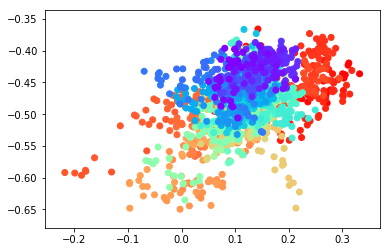

[Epoch 1] Loss: 686.1206, Recon loss: 685.7982, Latent loss: 0.3224, Time: 84.07


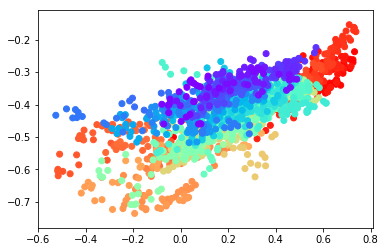

[Epoch 2] Loss: 683.9253, Recon loss: 683.3856, Latent loss: 0.5396, Time: 168.58


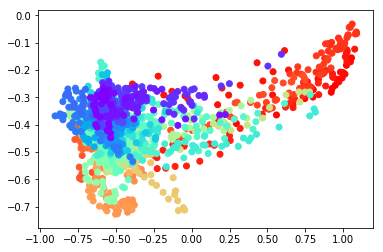

[Epoch 3] Loss: 650.7419, Recon loss: 650.0393, Latent loss: 0.7025, Time: 253.20


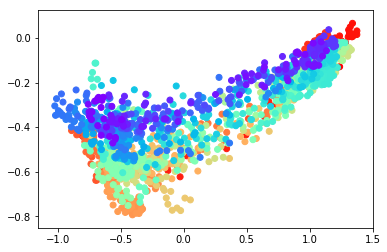

[Epoch 4] Loss: 625.8902, Recon loss: 625.1531, Latent loss: 0.7371, Time: 337.96


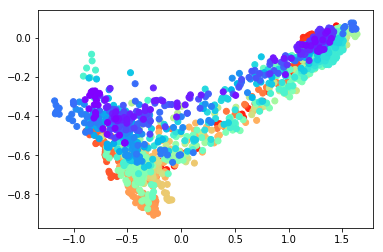

[Epoch 5] Loss: 648.1986, Recon loss: 647.2526, Latent loss: 0.9461, Time: 423.78


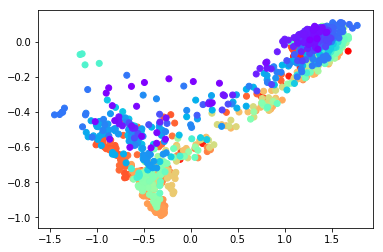

[Epoch 6] Loss: 621.0024, Recon loss: 619.9844, Latent loss: 1.0180, Time: 509.90


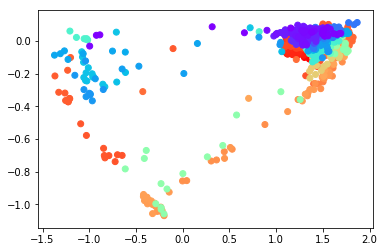

[Epoch 7] Loss: 640.1883, Recon loss: 639.0775, Latent loss: 1.1108, Time: 596.83


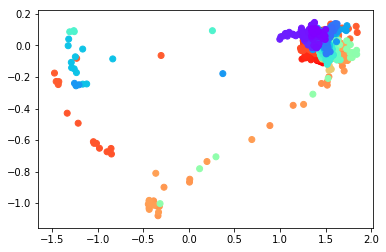

[Epoch 8] Loss: 614.0650, Recon loss: 612.9311, Latent loss: 1.1339, Time: 680.27


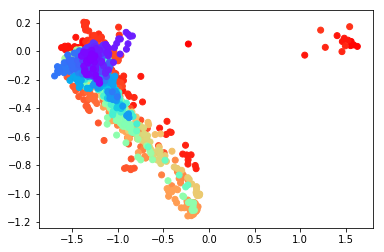

[Epoch 9] Loss: 609.9680, Recon loss: 608.8234, Latent loss: 1.1446, Time: 765.43


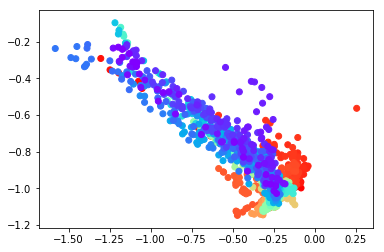

[Epoch 10] Loss: 606.5906, Recon loss: 605.3829, Latent loss: 1.2077, Time: 851.35


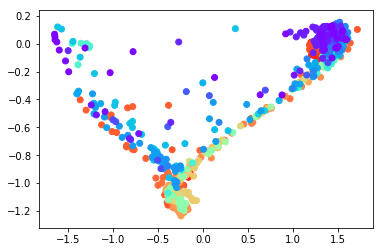

[Epoch 11] Loss: 614.0272, Recon loss: 612.8492, Latent loss: 1.1780, Time: 937.03


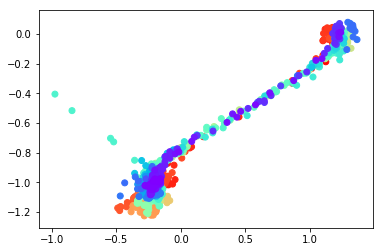

[Epoch 12] Loss: 603.0370, Recon loss: 601.8672, Latent loss: 1.1699, Time: 1020.92


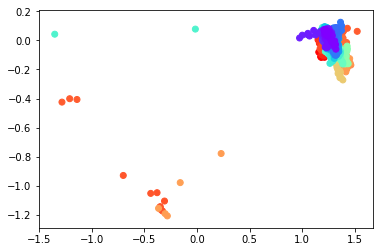

[Epoch 13] Loss: 602.9304, Recon loss: 601.7793, Latent loss: 1.1511, Time: 1106.11


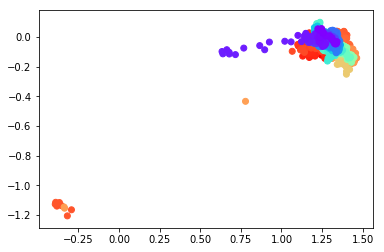

[Epoch 14] Loss: 611.5494, Recon loss: 610.3434, Latent loss: 1.2060, Time: 1189.15


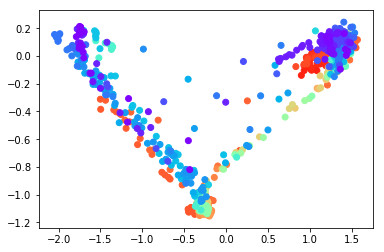

[Epoch 15] Loss: 603.2932, Recon loss: 602.0438, Latent loss: 1.2493, Time: 1272.44


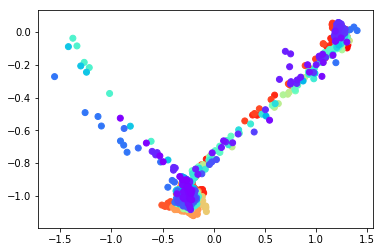

[Epoch 16] Loss: 625.0206, Recon loss: 623.7313, Latent loss: 1.2893, Time: 1355.95


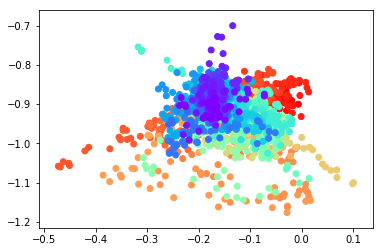

[Epoch 17] Loss: 630.4532, Recon loss: 629.1116, Latent loss: 1.3416, Time: 1440.74


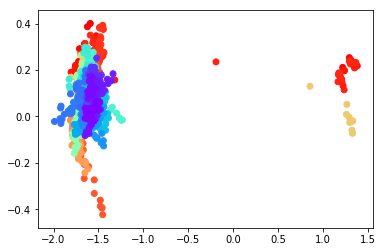

[Epoch 18] Loss: 600.8971, Recon loss: 599.4344, Latent loss: 1.4627, Time: 1527.07


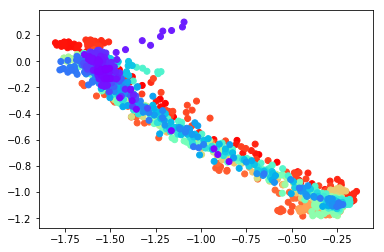

[Epoch 19] Loss: 592.5639, Recon loss: 591.2242, Latent loss: 1.3397, Time: 1613.38


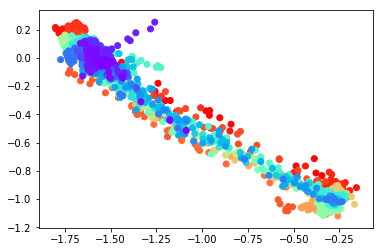

[Epoch 20] Loss: 614.8153, Recon loss: 613.3376, Latent loss: 1.4777, Time: 1697.77


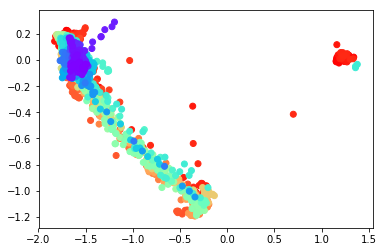

[Epoch 21] Loss: 610.6174, Recon loss: 609.2625, Latent loss: 1.3549, Time: 1781.09


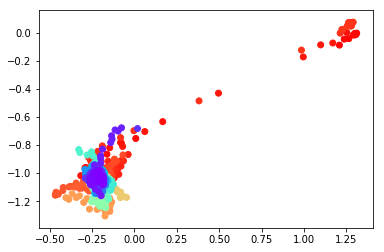

[Epoch 22] Loss: 595.4172, Recon loss: 594.0779, Latent loss: 1.3392, Time: 1864.77


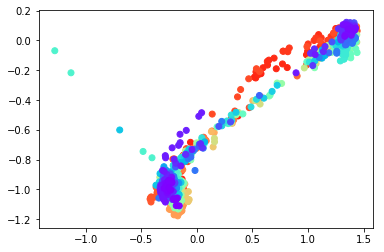

[Epoch 23] Loss: 588.7019, Recon loss: 587.4539, Latent loss: 1.2480, Time: 1948.51


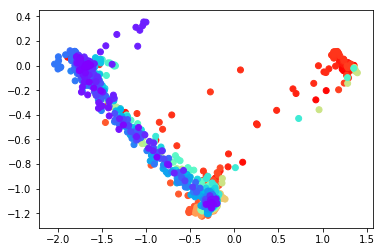

[Epoch 24] Loss: 612.6373, Recon loss: 611.2244, Latent loss: 1.4129, Time: 2032.63


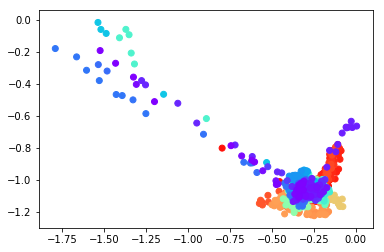

[Epoch 25] Loss: 600.5436, Recon loss: 599.1581, Latent loss: 1.3854, Time: 2116.35


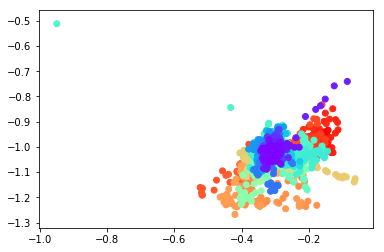

[Epoch 26] Loss: 594.4539, Recon loss: 593.0934, Latent loss: 1.3605, Time: 2200.26


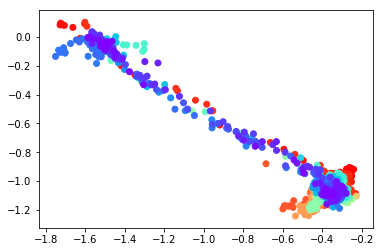

[Epoch 27] Loss: 610.8458, Recon loss: 609.4568, Latent loss: 1.3890, Time: 2284.14


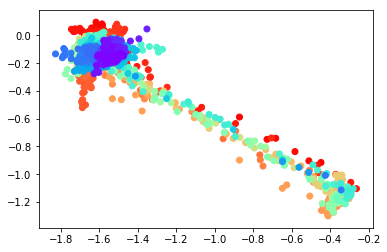

[Epoch 28] Loss: 606.4521, Recon loss: 604.8152, Latent loss: 1.6369, Time: 2367.95


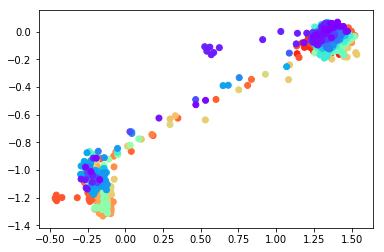

[Epoch 29] Loss: 600.5109, Recon loss: 599.1476, Latent loss: 1.3633, Time: 2451.49


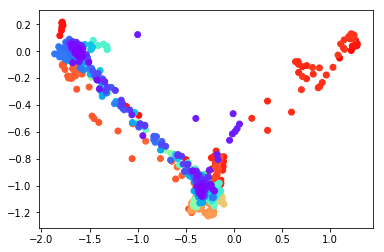

[Epoch 30] Loss: 599.5202, Recon loss: 597.9697, Latent loss: 1.5505, Time: 2535.03


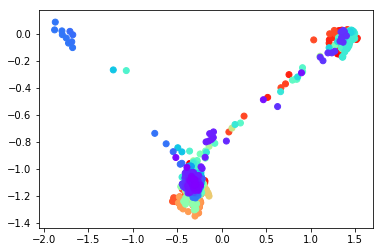

[Epoch 31] Loss: 601.2798, Recon loss: 599.8134, Latent loss: 1.4664, Time: 2618.41


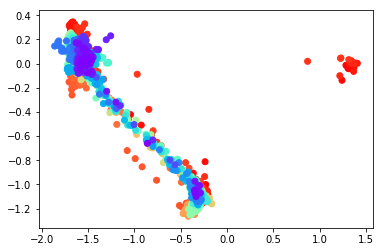

[Epoch 32] Loss: 612.4905, Recon loss: 610.9690, Latent loss: 1.5215, Time: 2701.83


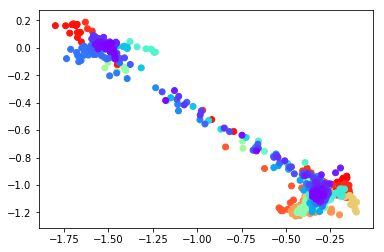

[Epoch 33] Loss: 589.9566, Recon loss: 588.6525, Latent loss: 1.3041, Time: 2784.46


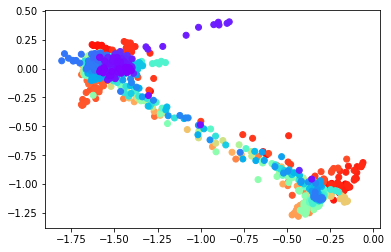

[Epoch 34] Loss: 584.2375, Recon loss: 582.8983, Latent loss: 1.3393, Time: 2867.86


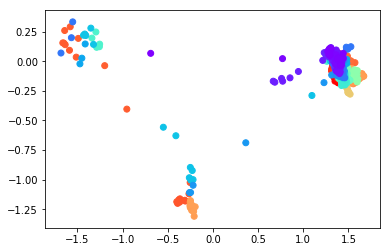

[Epoch 35] Loss: 593.8492, Recon loss: 592.4599, Latent loss: 1.3894, Time: 2950.48


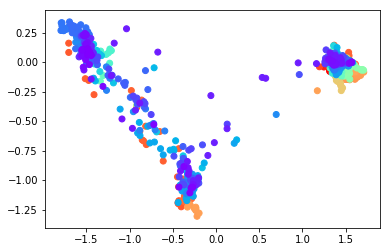

[Epoch 36] Loss: 597.8608, Recon loss: 596.4476, Latent loss: 1.4132, Time: 3033.84


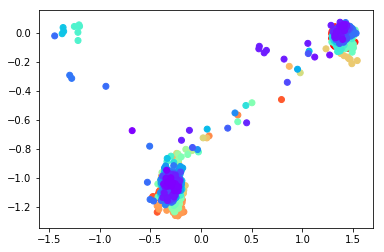

[Epoch 37] Loss: 581.9742, Recon loss: 580.5695, Latent loss: 1.4047, Time: 3117.13


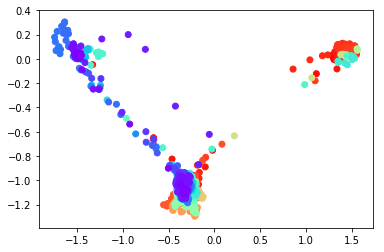

[Epoch 38] Loss: 568.3229, Recon loss: 566.8282, Latent loss: 1.4947, Time: 3200.26


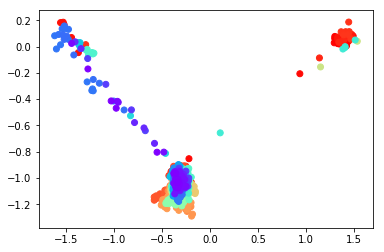

[Epoch 39] Loss: 581.4648, Recon loss: 580.0581, Latent loss: 1.4067, Time: 3284.15


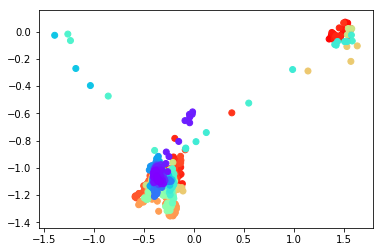

[Epoch 40] Loss: 583.9765, Recon loss: 582.5910, Latent loss: 1.3855, Time: 3367.35


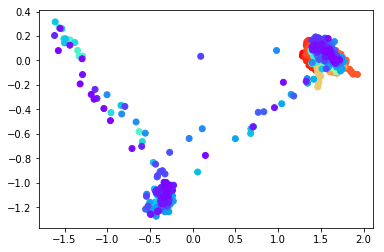

[Epoch 41] Loss: 613.8227, Recon loss: 611.9452, Latent loss: 1.8775, Time: 3450.87


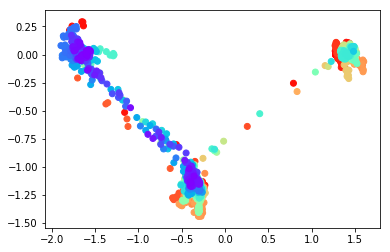

[Epoch 42] Loss: 575.9229, Recon loss: 574.3054, Latent loss: 1.6174, Time: 3534.04


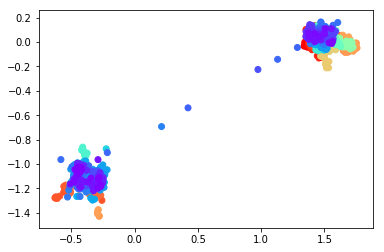

[Epoch 43] Loss: 597.5125, Recon loss: 596.0929, Latent loss: 1.4196, Time: 3616.86


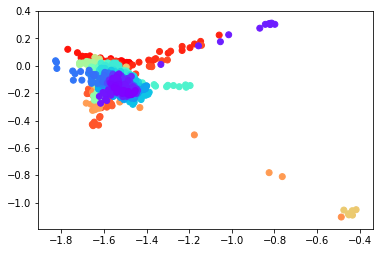

[Epoch 44] Loss: 611.5922, Recon loss: 610.0779, Latent loss: 1.5143, Time: 3699.56


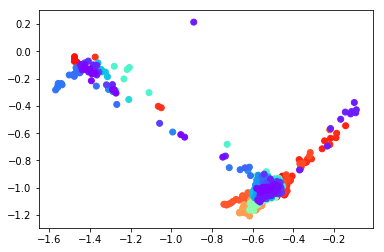

[Epoch 45] Loss: 621.9595, Recon loss: 620.4507, Latent loss: 1.5088, Time: 3782.99


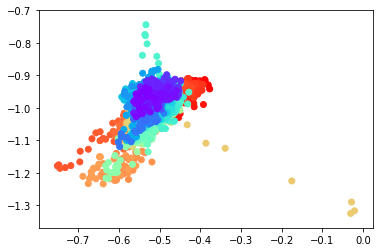

[Epoch 46] Loss: 597.7752, Recon loss: 596.3409, Latent loss: 1.4343, Time: 3866.15


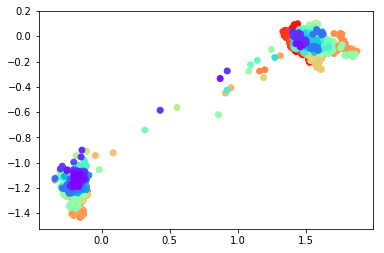

[Epoch 47] Loss: 610.5790, Recon loss: 609.1122, Latent loss: 1.4668, Time: 3949.08


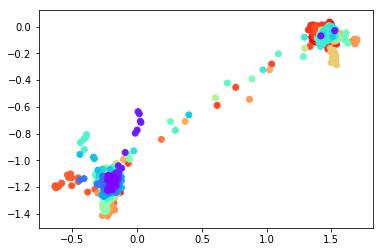

[Epoch 48] Loss: 565.4145, Recon loss: 564.0207, Latent loss: 1.3937, Time: 4032.19


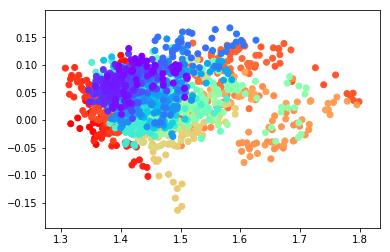

[Epoch 49] Loss: 575.9098, Recon loss: 574.2235, Latent loss: 1.6863, Time: 4115.98


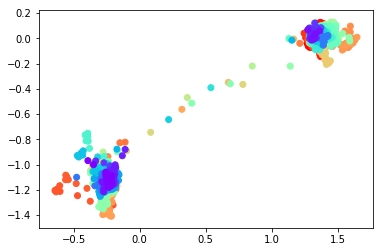

[Epoch 50] Loss: 600.4865, Recon loss: 599.0328, Latent loss: 1.4536, Time: 4199.51


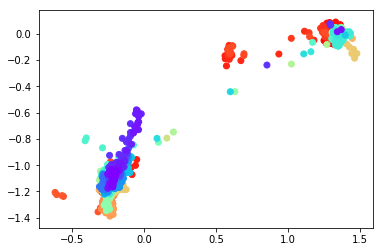

[Epoch 51] Loss: 590.9170, Recon loss: 589.3732, Latent loss: 1.5437, Time: 4282.98


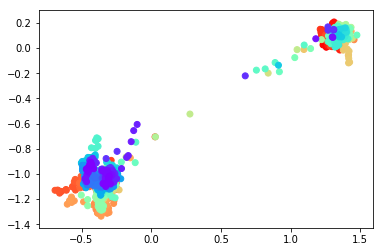

[Epoch 52] Loss: 559.2950, Recon loss: 557.8494, Latent loss: 1.4457, Time: 4366.57


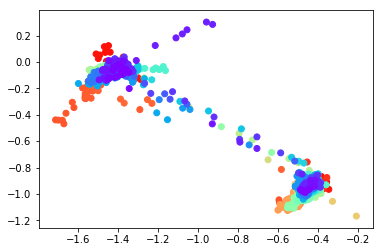

[Epoch 53] Loss: 590.5182, Recon loss: 589.2062, Latent loss: 1.3120, Time: 4450.09


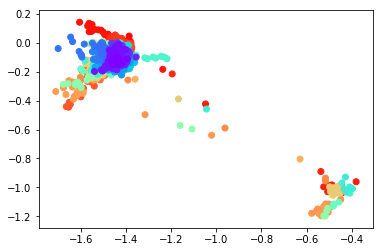

[Epoch 54] Loss: 600.3862, Recon loss: 598.9180, Latent loss: 1.4683, Time: 4533.58


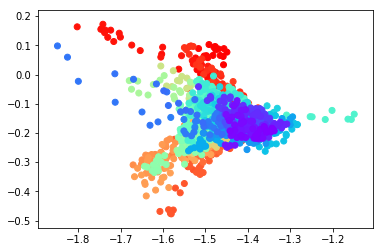

[Epoch 55] Loss: 593.4422, Recon loss: 592.0316, Latent loss: 1.4106, Time: 4617.30


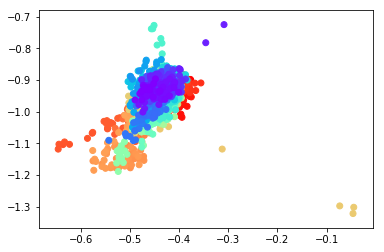

[Epoch 56] Loss: 581.2203, Recon loss: 579.9633, Latent loss: 1.2571, Time: 4700.67


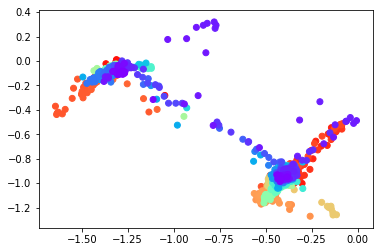

[Epoch 57] Loss: 587.5444, Recon loss: 586.2288, Latent loss: 1.3156, Time: 4783.62


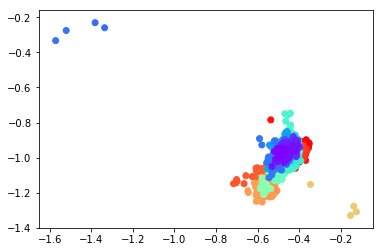

[Epoch 58] Loss: 576.7956, Recon loss: 575.5477, Latent loss: 1.2478, Time: 4866.54


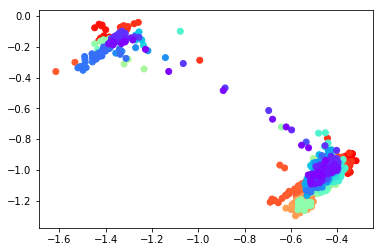

[Epoch 59] Loss: 594.2399, Recon loss: 592.9583, Latent loss: 1.2817, Time: 4949.47


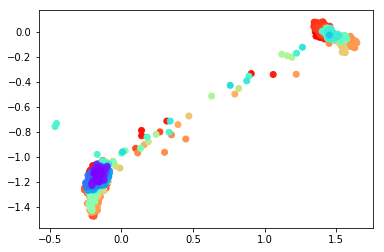

[Epoch 60] Loss: 580.4564, Recon loss: 578.9003, Latent loss: 1.5562, Time: 5032.28


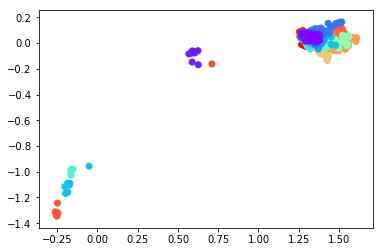

[Epoch 61] Loss: 587.0834, Recon loss: 585.7953, Latent loss: 1.2880, Time: 5115.68


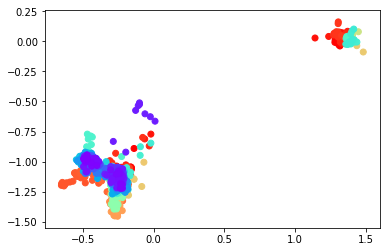

[Epoch 62] Loss: 588.9787, Recon loss: 587.7595, Latent loss: 1.2192, Time: 5198.98


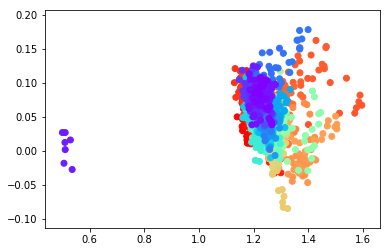

[Epoch 63] Loss: 574.3552, Recon loss: 573.1680, Latent loss: 1.1872, Time: 5282.32


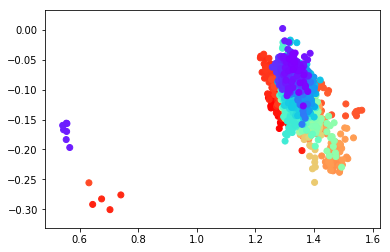

[Epoch 64] Loss: 606.4552, Recon loss: 605.1983, Latent loss: 1.2568, Time: 5365.41


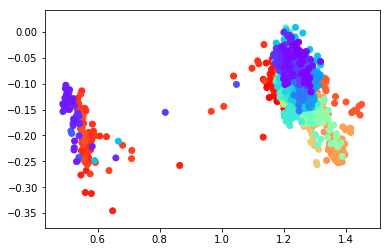

[Epoch 65] Loss: 580.4229, Recon loss: 579.3558, Latent loss: 1.0670, Time: 5448.74


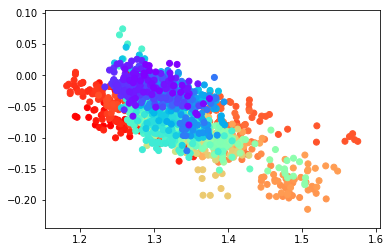

[Epoch 66] Loss: 610.4150, Recon loss: 609.0286, Latent loss: 1.3864, Time: 5532.49


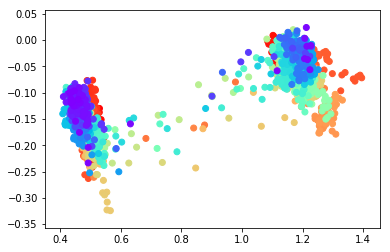

[Epoch 67] Loss: 610.5934, Recon loss: 609.4738, Latent loss: 1.1196, Time: 5615.47


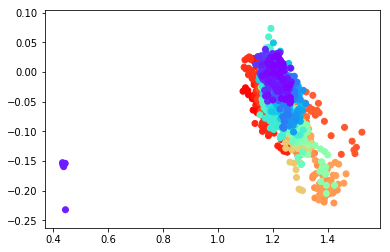

[Epoch 68] Loss: 603.6273, Recon loss: 602.3403, Latent loss: 1.2869, Time: 5698.62


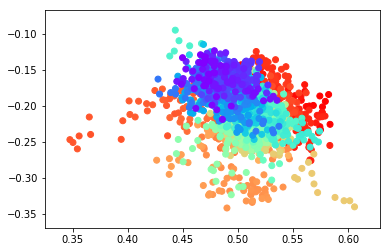

[Epoch 69] Loss: 582.2239, Recon loss: 581.3545, Latent loss: 0.8694, Time: 5781.69


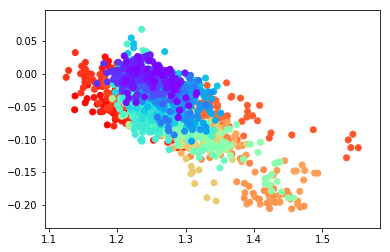

[Epoch 70] Loss: 604.3351, Recon loss: 603.1083, Latent loss: 1.2269, Time: 5865.00


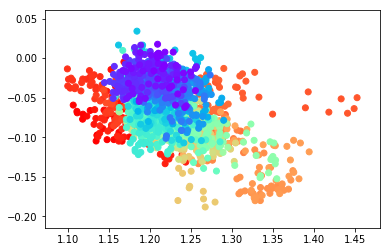

[Epoch 71] Loss: 595.5721, Recon loss: 594.1250, Latent loss: 1.4471, Time: 5948.68


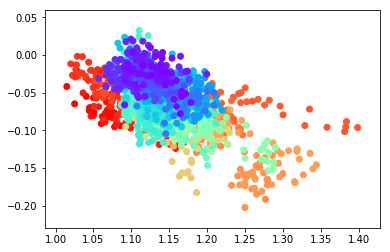

[Epoch 72] Loss: 581.2379, Recon loss: 579.8911, Latent loss: 1.3468, Time: 6031.73


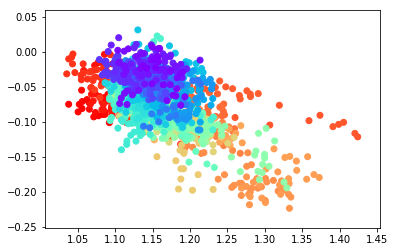

[Epoch 73] Loss: 621.3724, Recon loss: 620.1712, Latent loss: 1.2011, Time: 6114.67


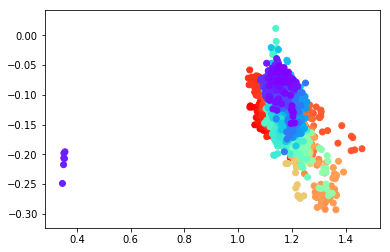

[Epoch 74] Loss: 586.7682, Recon loss: 585.5472, Latent loss: 1.2209, Time: 6197.39


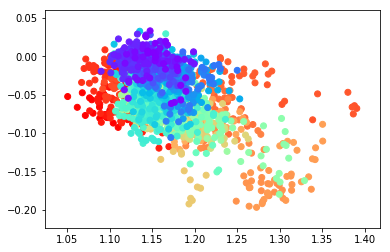

[Epoch 75] Loss: 596.7554, Recon loss: 595.5312, Latent loss: 1.2242, Time: 6280.18


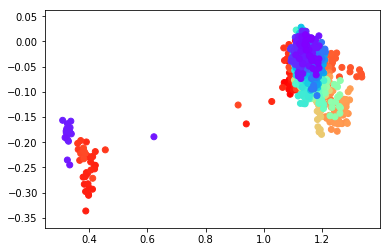

[Epoch 76] Loss: 587.6522, Recon loss: 586.5437, Latent loss: 1.1084, Time: 6363.06


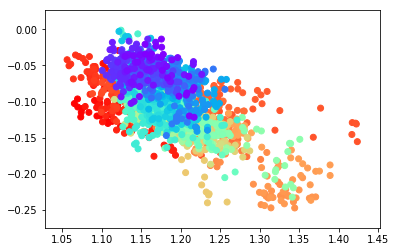

[Epoch 77] Loss: 588.9025, Recon loss: 587.7915, Latent loss: 1.1110, Time: 6446.38


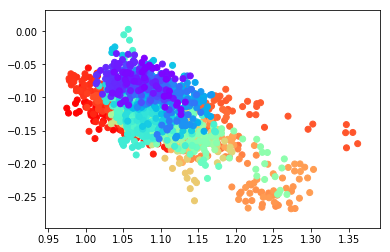

[Epoch 78] Loss: 604.0761, Recon loss: 602.6764, Latent loss: 1.3997, Time: 6529.79


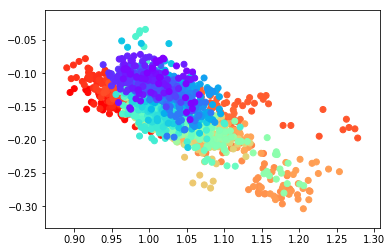

[Epoch 79] Loss: 583.4202, Recon loss: 582.1769, Latent loss: 1.2433, Time: 6612.99


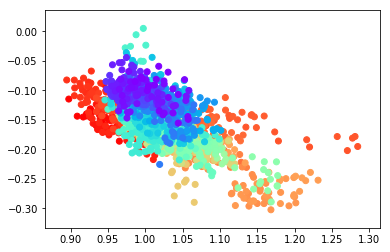

[Epoch 80] Loss: 592.1133, Recon loss: 590.9916, Latent loss: 1.1217, Time: 6695.91


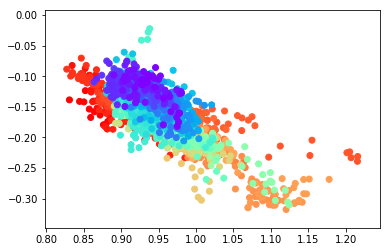

[Epoch 81] Loss: 600.8722, Recon loss: 599.6165, Latent loss: 1.2557, Time: 6779.60


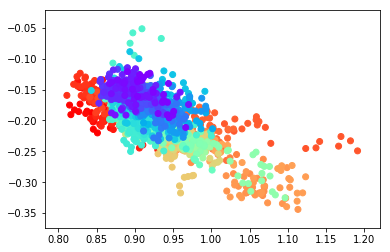

[Epoch 82] Loss: 597.1304, Recon loss: 595.9606, Latent loss: 1.1699, Time: 6862.53


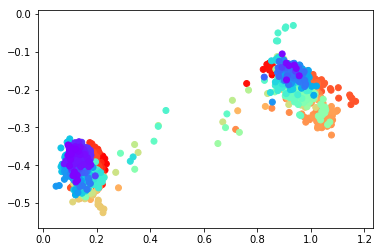

[Epoch 83] Loss: 629.0195, Recon loss: 628.2531, Latent loss: 0.7664, Time: 6945.30


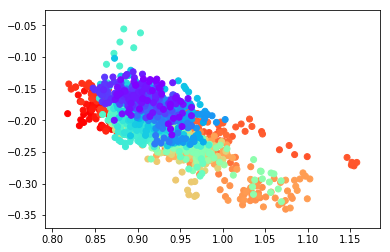

[Epoch 84] Loss: 597.6541, Recon loss: 596.6014, Latent loss: 1.0527, Time: 7028.99


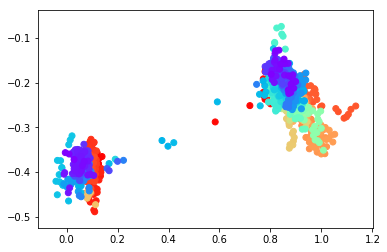

[Epoch 85] Loss: 603.7548, Recon loss: 602.9128, Latent loss: 0.8420, Time: 7111.65


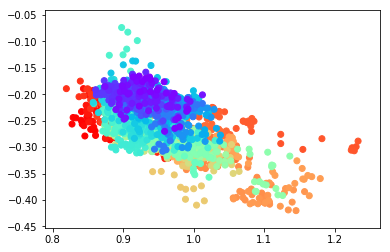

[Epoch 86] Loss: 626.9245, Recon loss: 625.9622, Latent loss: 0.9623, Time: 7195.52


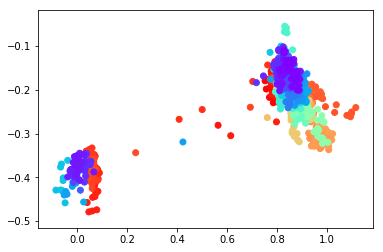

[Epoch 87] Loss: 582.8878, Recon loss: 582.0773, Latent loss: 0.8105, Time: 7278.24


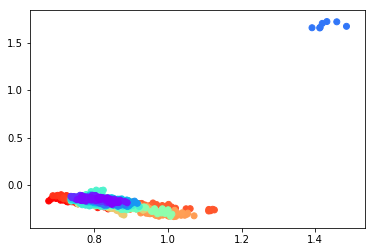

[Epoch 88] Loss: 601.0114, Recon loss: 599.4873, Latent loss: 1.5241, Time: 7361.27


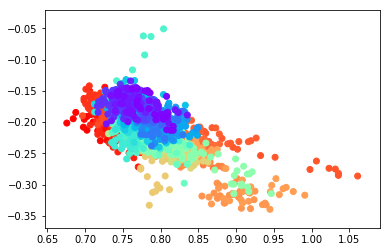

[Epoch 89] Loss: 578.2459, Recon loss: 577.3685, Latent loss: 0.8774, Time: 7444.26


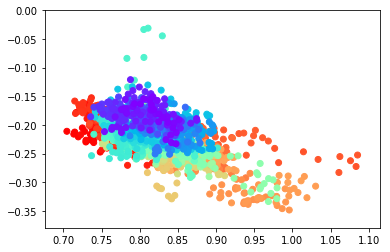

[Epoch 90] Loss: 610.9144, Recon loss: 609.7655, Latent loss: 1.1489, Time: 7526.97


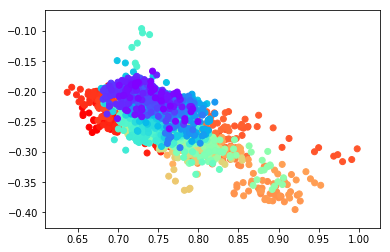

[Epoch 91] Loss: 598.0761, Recon loss: 596.9956, Latent loss: 1.0806, Time: 7610.08


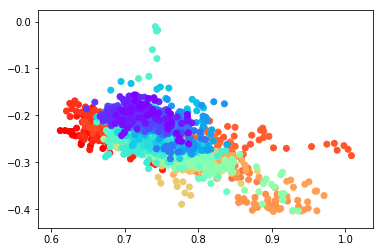

[Epoch 92] Loss: 582.6584, Recon loss: 581.5643, Latent loss: 1.0941, Time: 7692.75


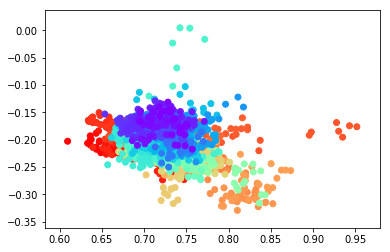

[Epoch 93] Loss: 583.6689, Recon loss: 582.8933, Latent loss: 0.7756, Time: 7775.73


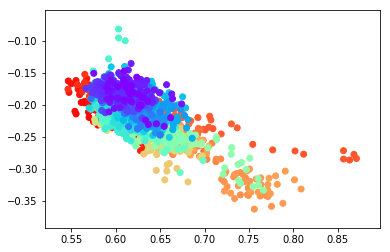

[Epoch 94] Loss: 558.6614, Recon loss: 557.6947, Latent loss: 0.9667, Time: 7858.87


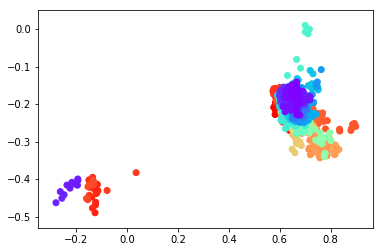

[Epoch 95] Loss: 579.0916, Recon loss: 577.8394, Latent loss: 1.2522, Time: 7941.95


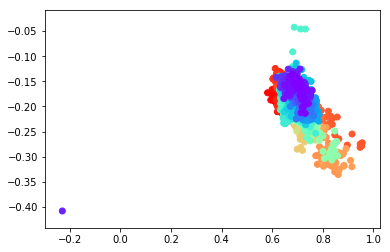

[Epoch 96] Loss: 585.7034, Recon loss: 584.3947, Latent loss: 1.3087, Time: 8025.29


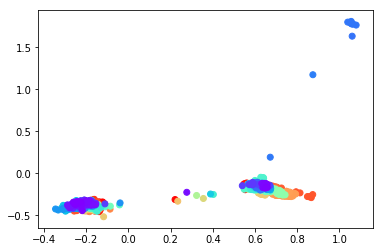

[Epoch 97] Loss: 584.5401, Recon loss: 583.1486, Latent loss: 1.3916, Time: 8108.29


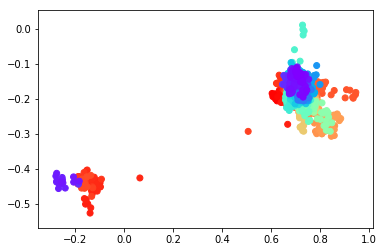

[Epoch 98] Loss: 583.7149, Recon loss: 582.6973, Latent loss: 1.0175, Time: 8191.56


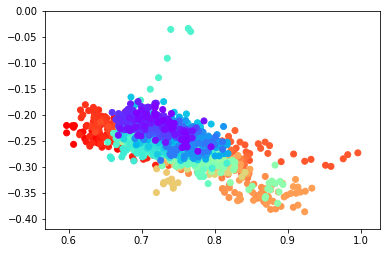

[Epoch 99] Loss: 568.0544, Recon loss: 567.2020, Latent loss: 0.8523, Time: 8274.81


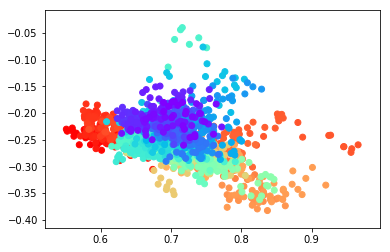

[Epoch 100] Loss: 608.1111, Recon loss: 607.1844, Latent loss: 0.9268, Time: 8358.05


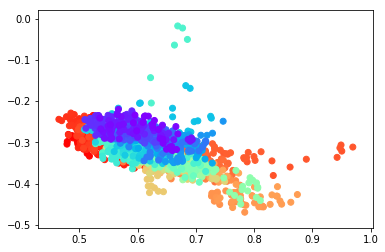

[Epoch 101] Loss: 594.0744, Recon loss: 593.1050, Latent loss: 0.9694, Time: 8440.88


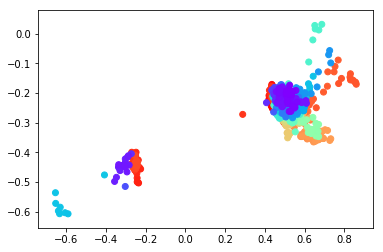

[Epoch 102] Loss: 578.5000, Recon loss: 577.6288, Latent loss: 0.8712, Time: 8523.95


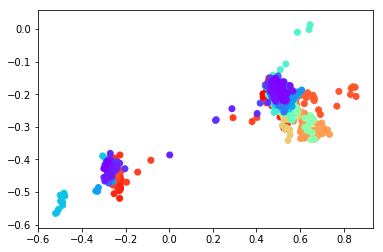

[Epoch 103] Loss: 589.4167, Recon loss: 588.1933, Latent loss: 1.2235, Time: 8607.31


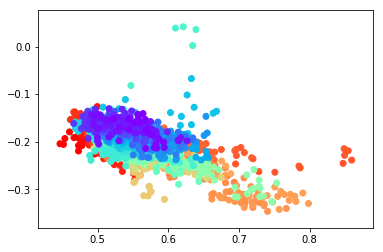

[Epoch 104] Loss: 569.0472, Recon loss: 567.7672, Latent loss: 1.2801, Time: 8690.23


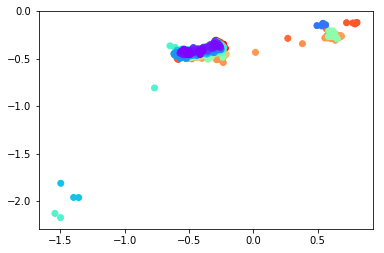

[Epoch 105] Loss: 608.8172, Recon loss: 607.1703, Latent loss: 1.6469, Time: 8773.13


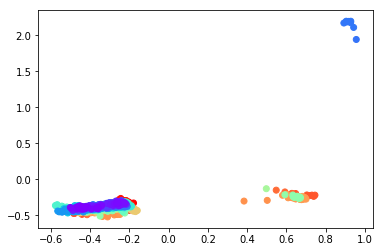

[Epoch 106] Loss: 601.1741, Recon loss: 599.5375, Latent loss: 1.6366, Time: 8856.28


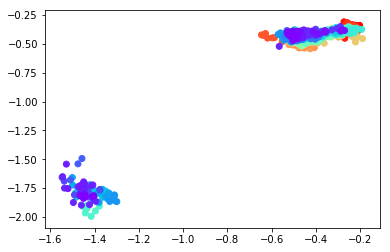

[Epoch 107] Loss: 596.3917, Recon loss: 594.5962, Latent loss: 1.7955, Time: 8939.27


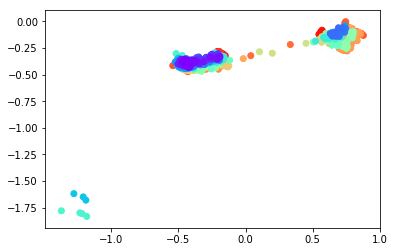

[Epoch 108] Loss: 586.4482, Recon loss: 584.5919, Latent loss: 1.8563, Time: 9022.42


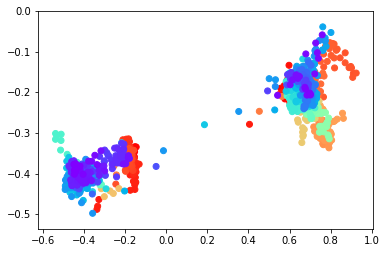

[Epoch 109] Loss: 560.6542, Recon loss: 559.5098, Latent loss: 1.1444, Time: 9105.58


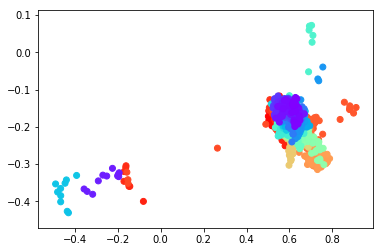

[Epoch 110] Loss: 598.3418, Recon loss: 597.2192, Latent loss: 1.1225, Time: 9188.06


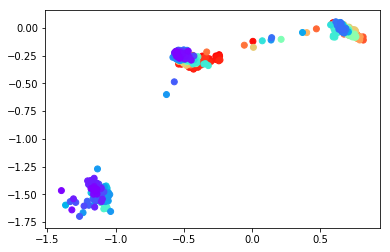

[Epoch 111] Loss: 579.5796, Recon loss: 577.3510, Latent loss: 2.2285, Time: 9271.26


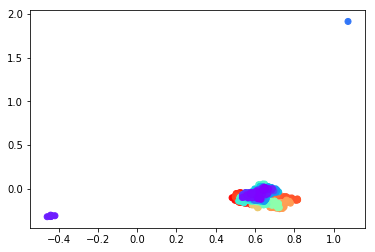

[Epoch 112] Loss: 558.1760, Recon loss: 556.3761, Latent loss: 1.7999, Time: 9353.74


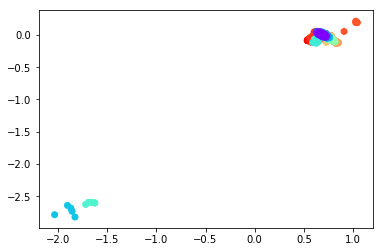

[Epoch 113] Loss: 562.2790, Recon loss: 559.6373, Latent loss: 2.6417, Time: 9436.76


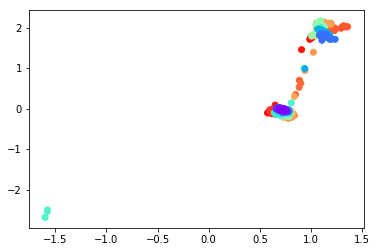

[Epoch 114] Loss: 578.4119, Recon loss: 575.8397, Latent loss: 2.5722, Time: 9520.41


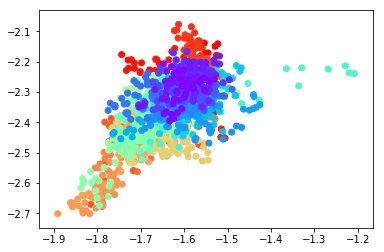

[Epoch 115] Loss: 622.4493, Recon loss: 618.5016, Latent loss: 3.9476, Time: 9603.30


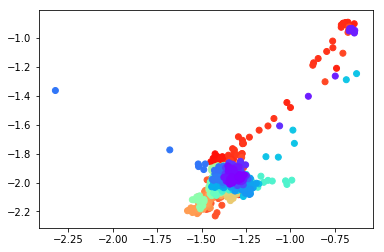

[Epoch 116] Loss: 604.0227, Recon loss: 601.1843, Latent loss: 2.8384, Time: 9686.20


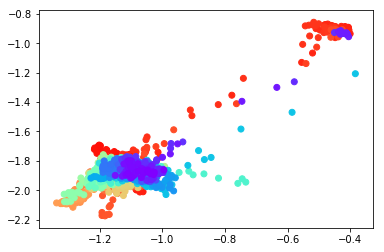

[Epoch 117] Loss: 598.0451, Recon loss: 595.4730, Latent loss: 2.5721, Time: 9769.25


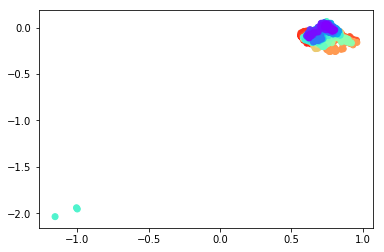

[Epoch 118] Loss: 569.7703, Recon loss: 568.2527, Latent loss: 1.5176, Time: 9852.09


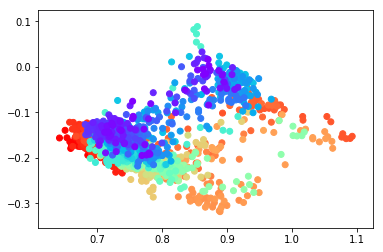

[Epoch 119] Loss: 595.0933, Recon loss: 594.2717, Latent loss: 0.8216, Time: 9934.97


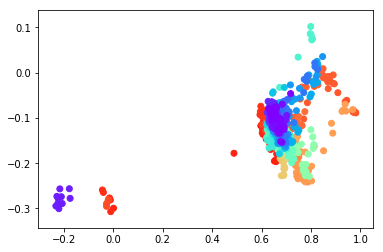

[Epoch 120] Loss: 583.6369, Recon loss: 582.7820, Latent loss: 0.8549, Time: 10017.79


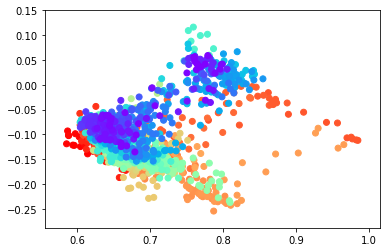

[Epoch 121] Loss: 580.1027, Recon loss: 579.0918, Latent loss: 1.0109, Time: 10100.74


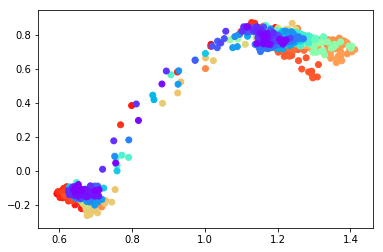

[Epoch 122] Loss: 592.5105, Recon loss: 591.3503, Latent loss: 1.1601, Time: 10183.94


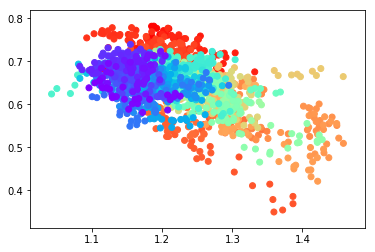

[Epoch 123] Loss: 594.2787, Recon loss: 592.7383, Latent loss: 1.5404, Time: 10267.33


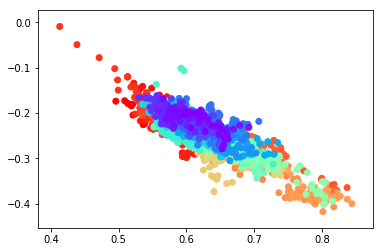

[Epoch 124] Loss: 596.5087, Recon loss: 595.6030, Latent loss: 0.9057, Time: 10350.35


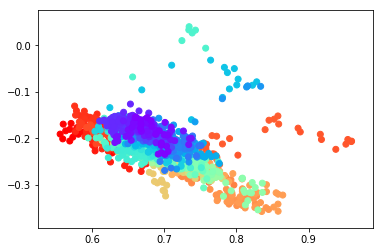

[Epoch 125] Loss: 608.9302, Recon loss: 607.9792, Latent loss: 0.9510, Time: 10433.81


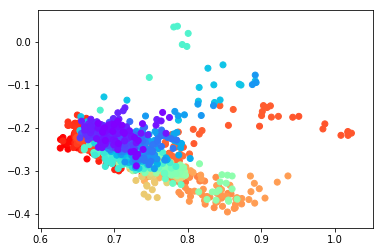

[Epoch 126] Loss: 595.3525, Recon loss: 594.5884, Latent loss: 0.7642, Time: 10517.02


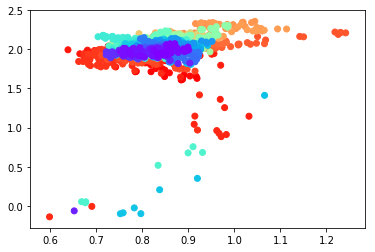

[Epoch 127] Loss: 596.1592, Recon loss: 594.1627, Latent loss: 1.9964, Time: 10599.64


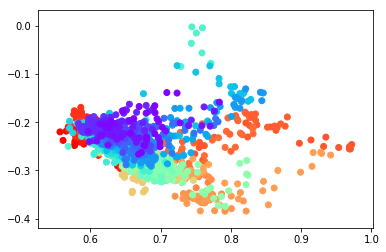

[Epoch 128] Loss: 602.7441, Recon loss: 601.9484, Latent loss: 0.7957, Time: 10682.79


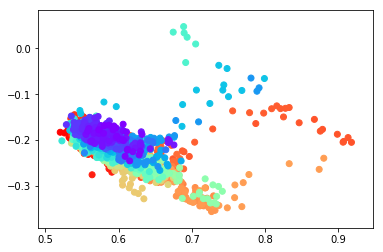

[Epoch 129] Loss: 589.7579, Recon loss: 588.9076, Latent loss: 0.8503, Time: 10765.69


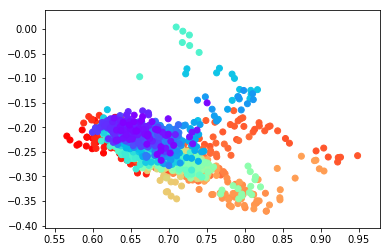

[Epoch 130] Loss: 604.0429, Recon loss: 602.9149, Latent loss: 1.1279, Time: 10848.65


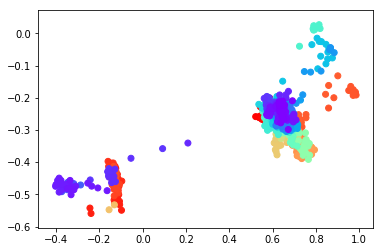

[Epoch 131] Loss: 579.9225, Recon loss: 579.2384, Latent loss: 0.6841, Time: 10931.82


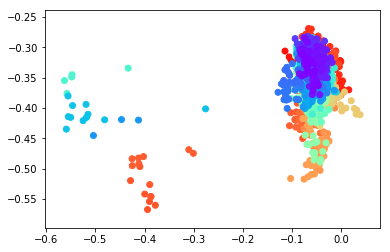

[Epoch 132] Loss: 612.5650, Recon loss: 611.9897, Latent loss: 0.5753, Time: 11015.32


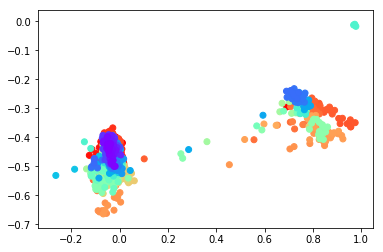

[Epoch 133] Loss: 590.5519, Recon loss: 589.8521, Latent loss: 0.6999, Time: 11098.08


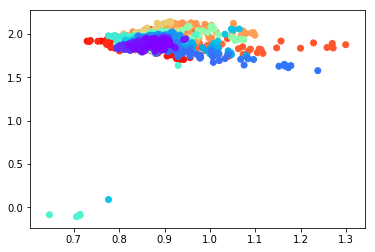

[Epoch 134] Loss: 597.3609, Recon loss: 595.0887, Latent loss: 2.2721, Time: 11181.22


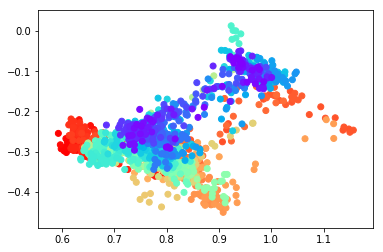

[Epoch 135] Loss: 577.9603, Recon loss: 576.9955, Latent loss: 0.9648, Time: 11264.10


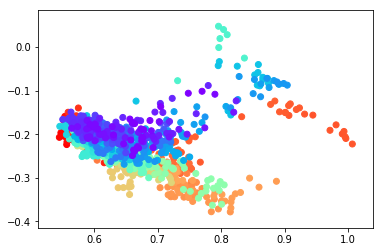

[Epoch 136] Loss: 569.2102, Recon loss: 568.2925, Latent loss: 0.9177, Time: 11347.26


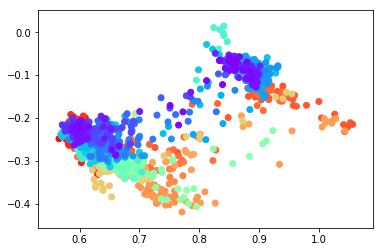

[Epoch 137] Loss: 583.1323, Recon loss: 582.2466, Latent loss: 0.8857, Time: 11429.90


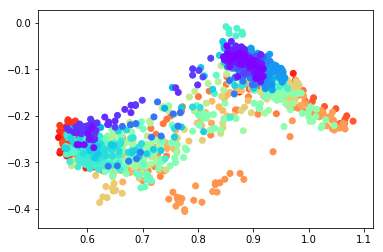

[Epoch 138] Loss: 578.3027, Recon loss: 577.5280, Latent loss: 0.7746, Time: 11512.83


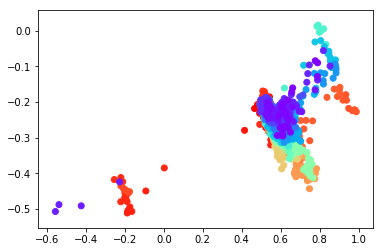

[Epoch 139] Loss: 562.3412, Recon loss: 561.4912, Latent loss: 0.8501, Time: 11596.16


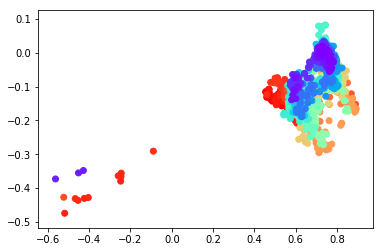

[Epoch 140] Loss: 593.8346, Recon loss: 591.5637, Latent loss: 2.2709, Time: 11679.02


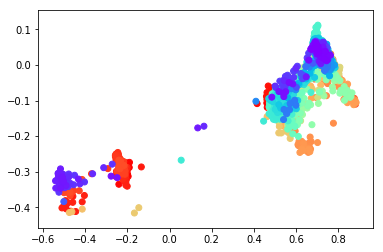

[Epoch 141] Loss: 604.6255, Recon loss: 602.4942, Latent loss: 2.1314, Time: 11761.98


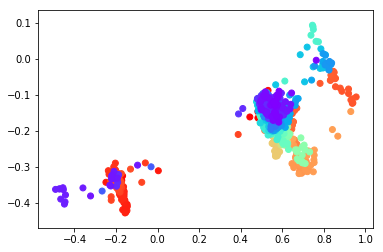

[Epoch 142] Loss: 562.9483, Recon loss: 561.7665, Latent loss: 1.1818, Time: 11844.78


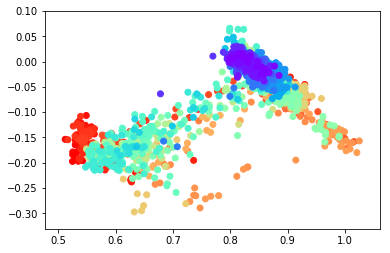

[Epoch 143] Loss: 581.0573, Recon loss: 579.6388, Latent loss: 1.4185, Time: 11927.57


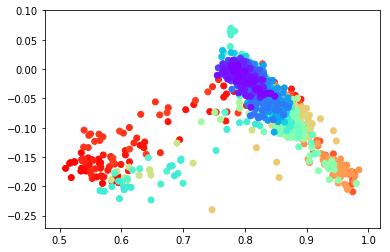

[Epoch 144] Loss: 591.8217, Recon loss: 590.1799, Latent loss: 1.6417, Time: 12011.09


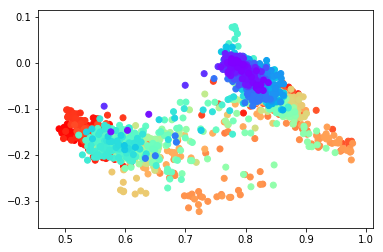

[Epoch 145] Loss: 575.7211, Recon loss: 574.3011, Latent loss: 1.4200, Time: 12094.25


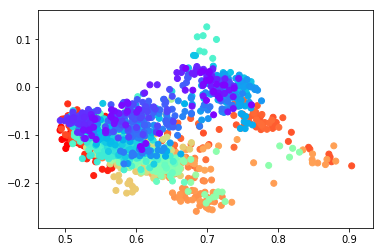

[Epoch 146] Loss: 597.0126, Recon loss: 595.3322, Latent loss: 1.6804, Time: 12177.49


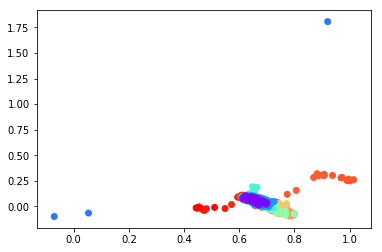

[Epoch 147] Loss: 572.7421, Recon loss: 570.7339, Latent loss: 2.0081, Time: 12260.51


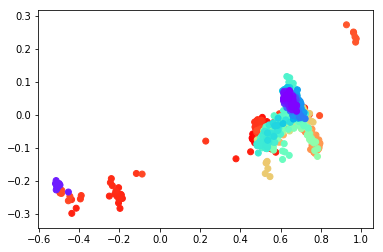

[Epoch 148] Loss: 563.9745, Recon loss: 561.9416, Latent loss: 2.0330, Time: 12343.29


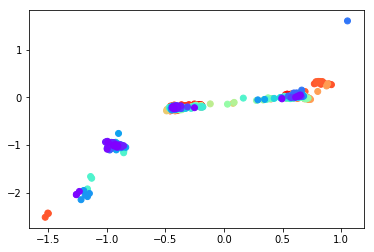

[Epoch 149] Loss: 582.3833, Recon loss: 580.0286, Latent loss: 2.3547, Time: 12426.02


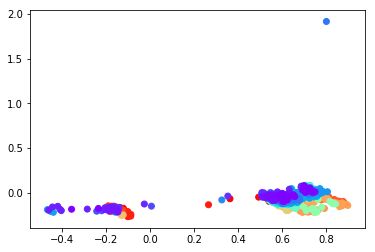

[Epoch 150] Loss: 592.1699, Recon loss: 590.7072, Latent loss: 1.4628, Time: 12508.64


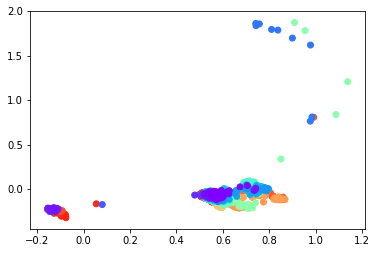

[Epoch 151] Loss: 566.3010, Recon loss: 564.8567, Latent loss: 1.4442, Time: 12592.16


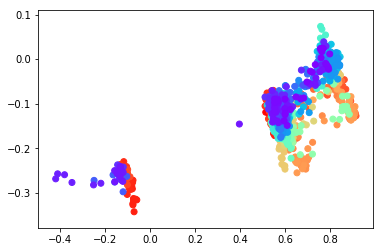

[Epoch 152] Loss: 566.5127, Recon loss: 565.2418, Latent loss: 1.2710, Time: 12675.48


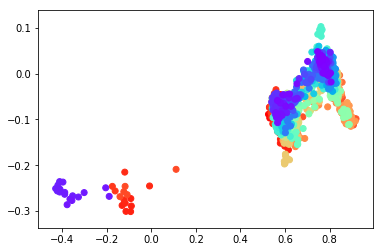

[Epoch 153] Loss: 559.9319, Recon loss: 558.3898, Latent loss: 1.5421, Time: 12758.13


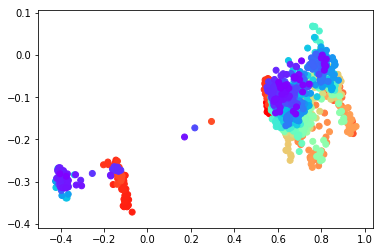

[Epoch 154] Loss: 584.4449, Recon loss: 583.2975, Latent loss: 1.1474, Time: 12841.14


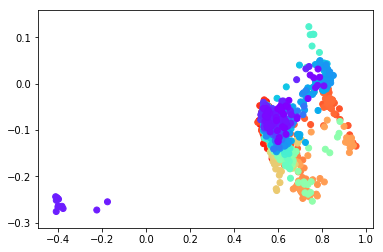

[Epoch 155] Loss: 559.9959, Recon loss: 558.5133, Latent loss: 1.4827, Time: 12923.78


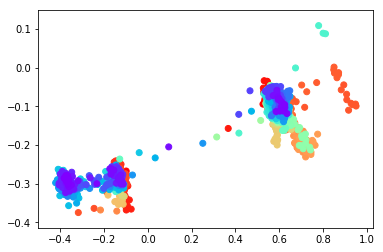

[Epoch 156] Loss: 573.3542, Recon loss: 572.2576, Latent loss: 1.0966, Time: 13006.85


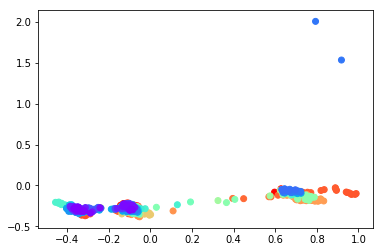

[Epoch 157] Loss: 590.9891, Recon loss: 589.4961, Latent loss: 1.4930, Time: 13089.96


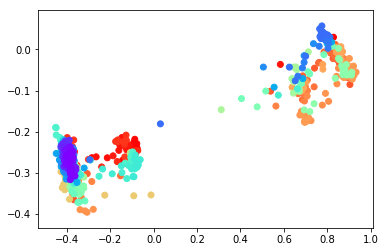

[Epoch 158] Loss: 594.1223, Recon loss: 592.7765, Latent loss: 1.3458, Time: 13172.89


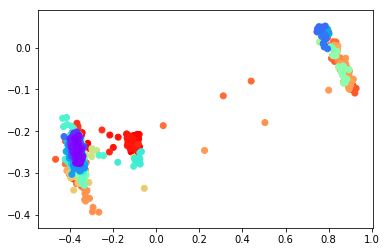

[Epoch 159] Loss: 597.7328, Recon loss: 596.4359, Latent loss: 1.2970, Time: 13255.89


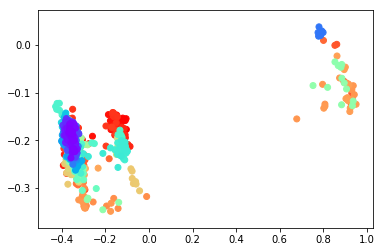

[Epoch 160] Loss: 574.3676, Recon loss: 572.8344, Latent loss: 1.5332, Time: 13338.79


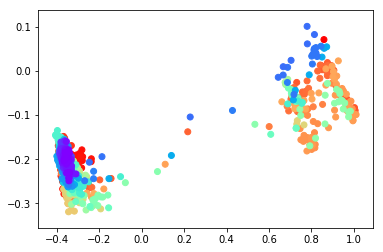

[Epoch 161] Loss: 613.3345, Recon loss: 611.9338, Latent loss: 1.4007, Time: 13421.76


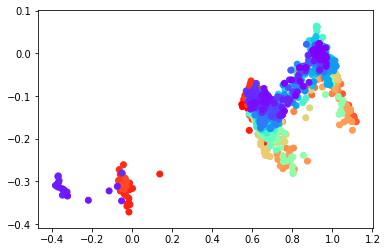

[Epoch 162] Loss: 575.1440, Recon loss: 574.1992, Latent loss: 0.9448, Time: 13504.88


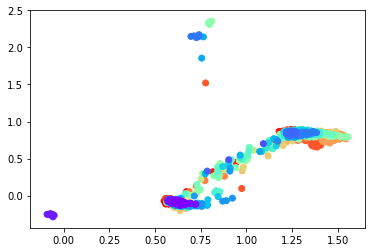

[Epoch 163] Loss: 598.2563, Recon loss: 596.2654, Latent loss: 1.9908, Time: 13587.43


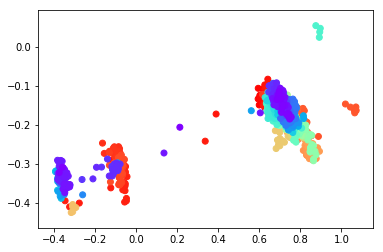

[Epoch 164] Loss: 573.3145, Recon loss: 572.3036, Latent loss: 1.0109, Time: 13670.78


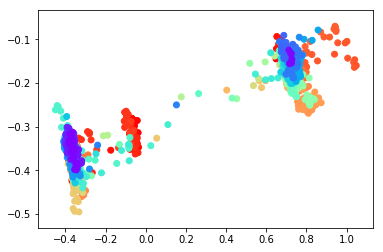

[Epoch 165] Loss: 579.2311, Recon loss: 578.1893, Latent loss: 1.0418, Time: 13753.82


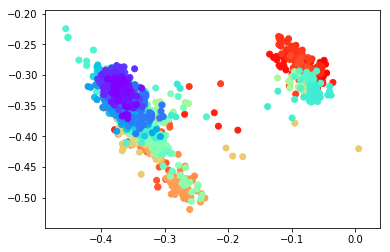

[Epoch 166] Loss: 594.3675, Recon loss: 593.2921, Latent loss: 1.0753, Time: 13836.93


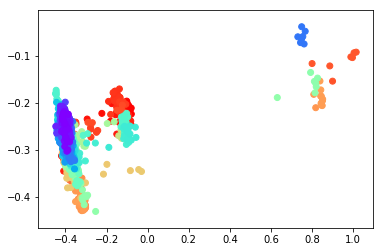

[Epoch 167] Loss: 593.5981, Recon loss: 592.2479, Latent loss: 1.3501, Time: 13920.07


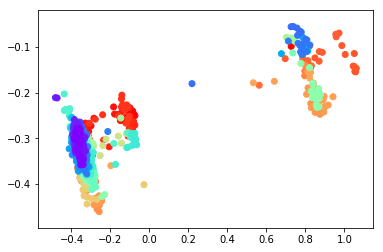

[Epoch 168] Loss: 582.8864, Recon loss: 581.8566, Latent loss: 1.0298, Time: 14003.06


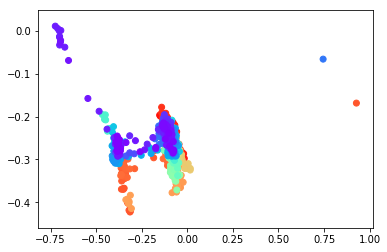

[Epoch 169] Loss: 579.0859, Recon loss: 577.8083, Latent loss: 1.2776, Time: 14086.20


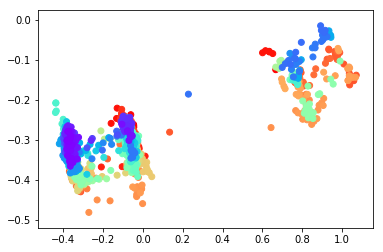

[Epoch 170] Loss: 565.0532, Recon loss: 563.7664, Latent loss: 1.2868, Time: 14168.95


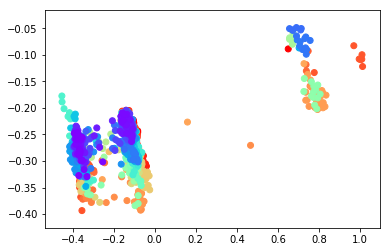

[Epoch 171] Loss: 567.6151, Recon loss: 566.2711, Latent loss: 1.3440, Time: 14251.69


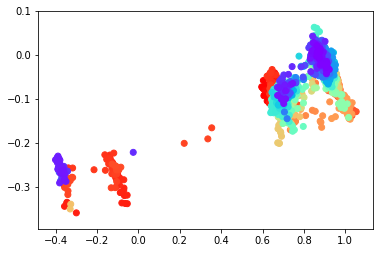

[Epoch 172] Loss: 559.4427, Recon loss: 558.1444, Latent loss: 1.2983, Time: 14334.47


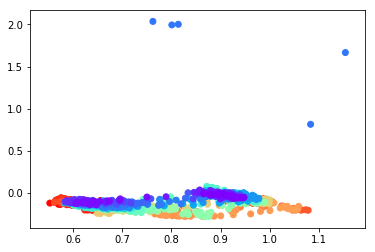

[Epoch 173] Loss: 592.7365, Recon loss: 591.3068, Latent loss: 1.4298, Time: 14417.45


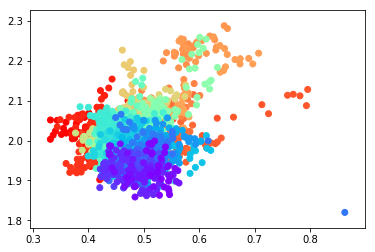

[Epoch 174] Loss: 592.0368, Recon loss: 589.6105, Latent loss: 2.4263, Time: 14500.61


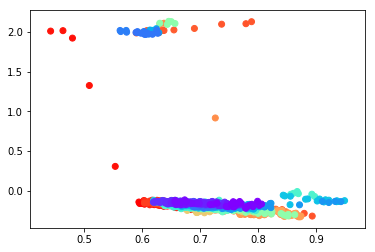

[Epoch 175] Loss: 583.8395, Recon loss: 582.4992, Latent loss: 1.3404, Time: 14583.78


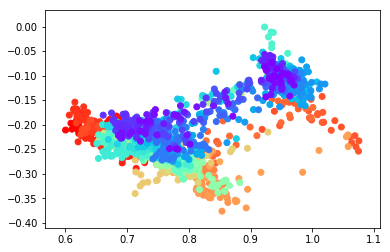

[Epoch 176] Loss: 570.0971, Recon loss: 568.8146, Latent loss: 1.2825, Time: 14666.78


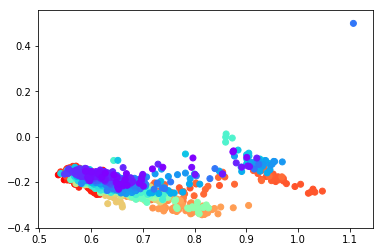

[Epoch 177] Loss: 615.7816, Recon loss: 614.4667, Latent loss: 1.3150, Time: 14749.46


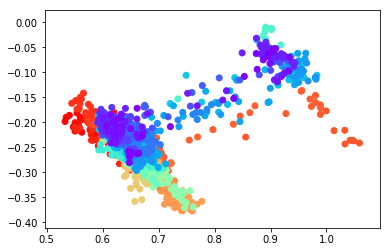

[Epoch 178] Loss: 569.3395, Recon loss: 568.2741, Latent loss: 1.0655, Time: 14832.37


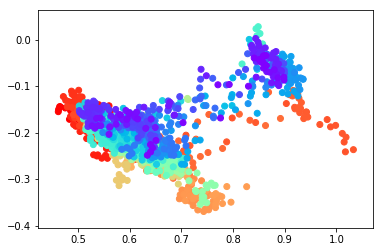

[Epoch 179] Loss: 583.8397, Recon loss: 582.7972, Latent loss: 1.0425, Time: 14915.09


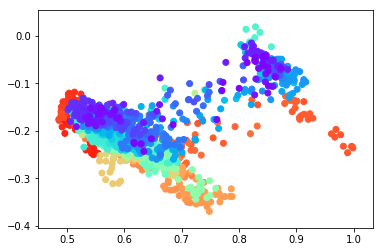

[Epoch 180] Loss: 596.6483, Recon loss: 595.6765, Latent loss: 0.9718, Time: 14998.04


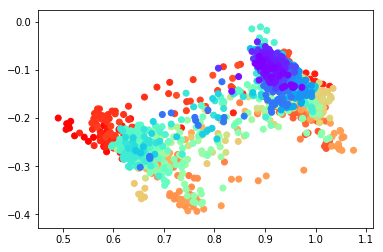

[Epoch 181] Loss: 583.1176, Recon loss: 582.1016, Latent loss: 1.0159, Time: 15081.07


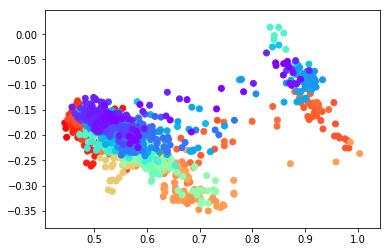

[Epoch 182] Loss: 572.3948, Recon loss: 571.5999, Latent loss: 0.7948, Time: 15163.60


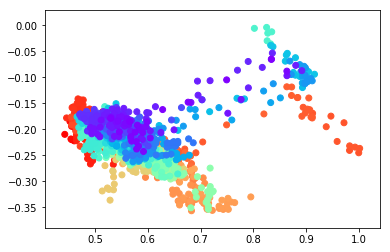

[Epoch 183] Loss: 565.8193, Recon loss: 564.9755, Latent loss: 0.8439, Time: 15246.36


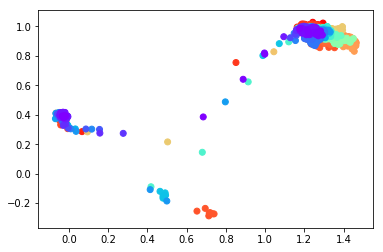

[Epoch 184] Loss: 575.3231, Recon loss: 574.1610, Latent loss: 1.1621, Time: 15328.85


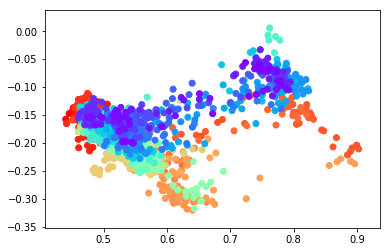

[Epoch 185] Loss: 573.7284, Recon loss: 572.7645, Latent loss: 0.9639, Time: 15412.21


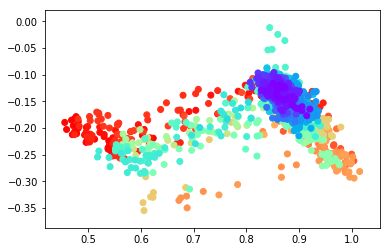

[Epoch 186] Loss: 606.5757, Recon loss: 605.6008, Latent loss: 0.9749, Time: 15495.23


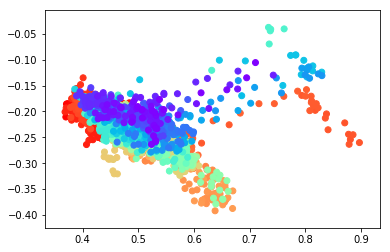

[Epoch 187] Loss: 577.6230, Recon loss: 576.7600, Latent loss: 0.8631, Time: 15577.72


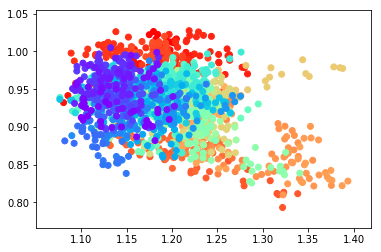

[Epoch 188] Loss: 586.6296, Recon loss: 584.9620, Latent loss: 1.6676, Time: 15660.80


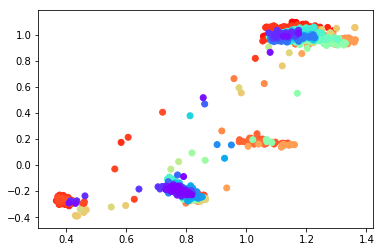

[Epoch 189] Loss: 540.3107, Recon loss: 538.9360, Latent loss: 1.3746, Time: 15744.00


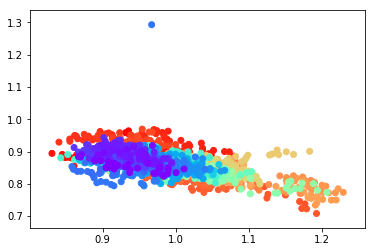

[Epoch 190] Loss: 599.3159, Recon loss: 597.1486, Latent loss: 2.1674, Time: 15826.63


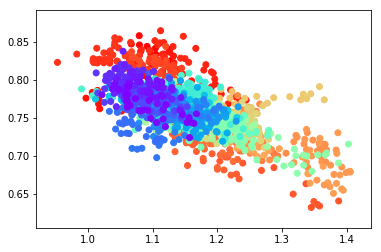

[Epoch 191] Loss: 600.1558, Recon loss: 598.0955, Latent loss: 2.0604, Time: 15909.72


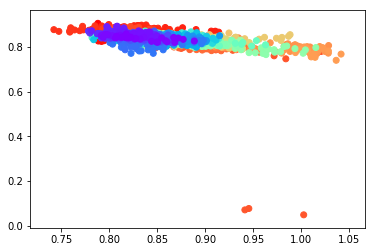

[Epoch 192] Loss: 595.8341, Recon loss: 594.4760, Latent loss: 1.3582, Time: 15992.34


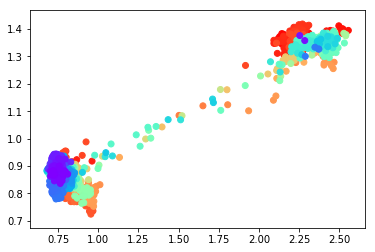

[Epoch 193] Loss: 616.7191, Recon loss: 614.8229, Latent loss: 1.8962, Time: 16075.43


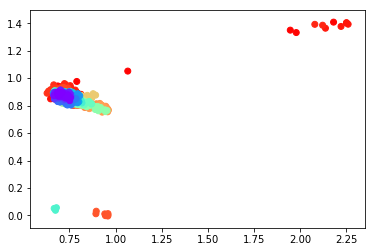

[Epoch 194] Loss: 589.7274, Recon loss: 588.0919, Latent loss: 1.6355, Time: 16158.05


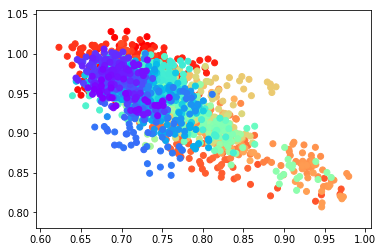

[Epoch 195] Loss: 580.2211, Recon loss: 579.0123, Latent loss: 1.2088, Time: 16240.67


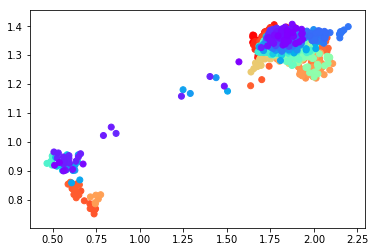

[Epoch 196] Loss: 592.1777, Recon loss: 590.4003, Latent loss: 1.7773, Time: 16323.32


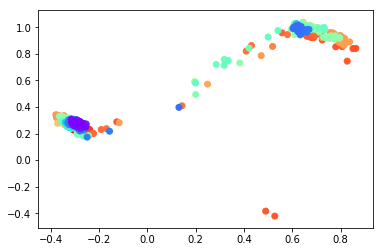

[Epoch 197] Loss: 596.0274, Recon loss: 594.8884, Latent loss: 1.1390, Time: 16406.28


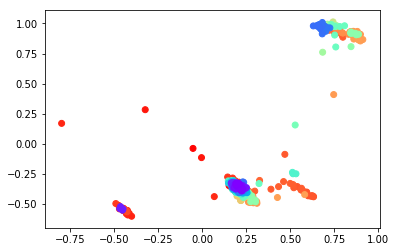

[Epoch 198] Loss: 560.5205, Recon loss: 559.4322, Latent loss: 1.0883, Time: 16489.37


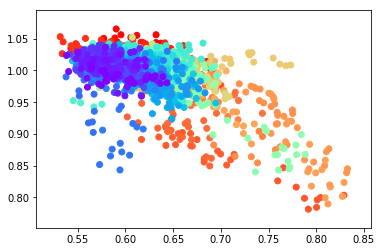

[Epoch 199] Loss: 594.9048, Recon loss: 593.7812, Latent loss: 1.1236, Time: 16572.24


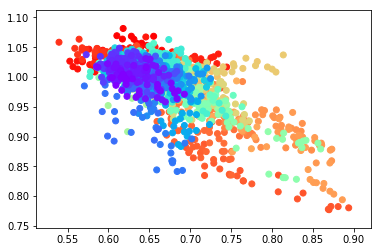

[Epoch 200] Loss: 569.6961, Recon loss: 568.4596, Latent loss: 1.2365, Time: 16654.98
Done! - 16655.056


In [199]:
tf.reset_default_graph()
model = VAE(n_z=2, learning_rate=1e-3, beta=1)
trainer(model, bs=1000, ne=200, print_step=1, save_step=5)

### Evaluation

In [174]:
model_name = 'mg_10'

tf.reset_default_graph()
model = VAE_3layer(n_z=16, learning_rate=1e-4, beta=10)
saver = tf.train.Saver()
model.restore(saver, './ckpt/%s.ckpt' %model_name)

INFO:tensorflow:Restoring parameters from ./ckpt/mg_10.ckpt


/home/qara/anaconda3/lib/python3.6/site-packages/tensorflow/python/client/session.py:1714: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [175]:
def title_embed(title):
    keywords = words2keywords(title)
    if len(keywords)==0:
        return
    words, idf_scores = zip(*keywords)
    idf_scores = idf_scores/sum(idf_scores)

    avg_embedding = np.zeros(100, dtype=np.float32)
    for idx in range(len(words)):
        word = words[idx]
        embedding_vec = embedding[word]
        idf = idf_scores[idx]
        avg_embedding += idf*embedding_vec

    return avg_embedding

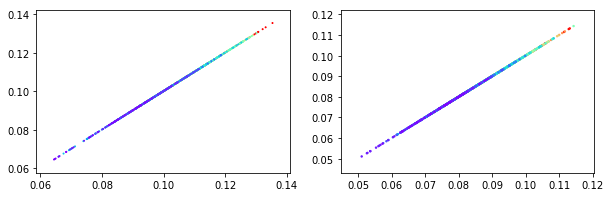

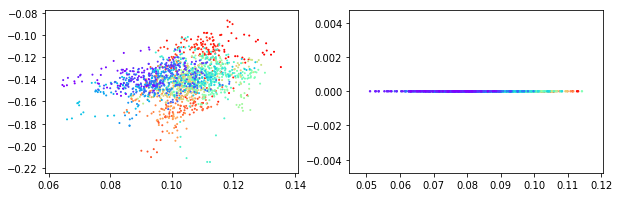

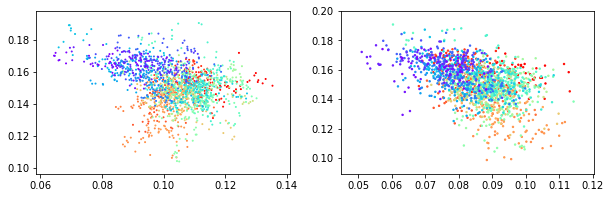

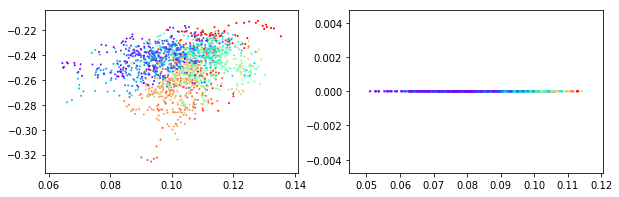

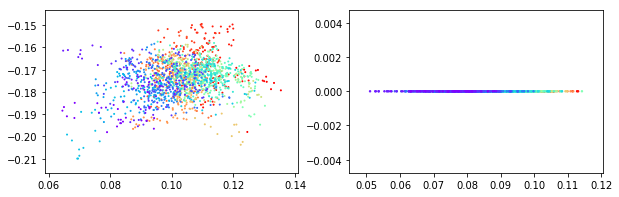

...

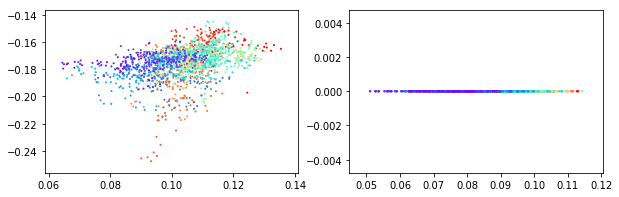

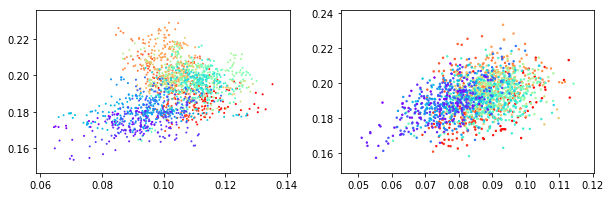

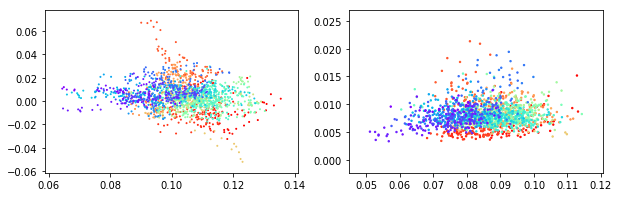

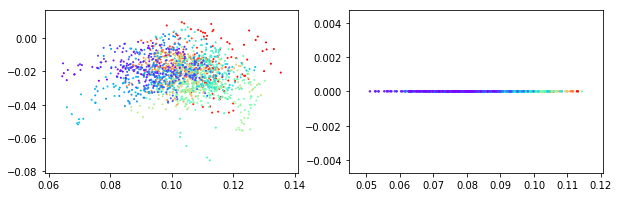

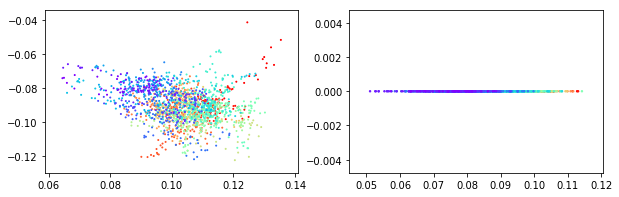

KeyboardInterrupt: 

In [179]:
axis_1 = 1
axis_2 = 80

before = list(new_df.avg_embed_log)
after = model.reconstructor(before)

colors = cm.rainbow(np.linspace(1, 0, len(new_df)))

for axis_2 in range(1,100):
    fig, ax = plt.subplots(1, 2, figsize=(10,3))
    x1 = np.array(list(before))[:,axis_1]
    y1 = np.array(list(before))[:,axis_2]
    x2 = np.array(list(after))[:,axis_1]
    y2 = np.array(list(after))[:,axis_2]

    ax[0].scatter(x1, y1, color=colors, s=2 )
    ax[1].scatter(x2, y2, color=colors, s=2)
    plt.show()